<a href="https://colab.research.google.com/github/YARAMFWATBAN/Brick-breaker-game/blob/main/price_prediction_code_final.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
 !pip install pmdarima

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 9.3 MB/s eta 0:00:00


In [ ]:
import os
import warnings
warnings.filterwarnings('ignore')
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.arima_model import ARIMA
from sklearn.metrics import mean_squared_error, mean_absolute_error
import math


**Load and Preprocess Data**

In [ ]:
import os
os.getcwd()

'/content'

In [ ]:
filename = '/content/drive/MyDrive/filtered_stock_data.csv'




In [ ]:
df=pd.read_csv(filename)

In [ ]:

# df.index=pd.DatetimeIndex(df.index).to_period('M')

In [ ]:
df.head()

,date,tiker,open,high,low,close,volume
0,2021-05-06,1010,24.8,24.82,24.32,24.42,967687
1,2021-05-05,1010,25.1,25.10,24.76,24.80,745371
2,2021-05-04,1010,25.5,25.60,24.76,24.90,1935432
3,2021-05-03,1010,25.9,25.90,25.45,25.45,745641
4,2021-05-02,1010,26.2,26.40,25.90,25.90,1087119


In [ ]:
#check info dataset like dataType. as you see
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 493307 entries, 0 to 493306
Data columns (total 7 columns):
 #   Column  Non-Null Count   Dtype  
---  ------  --------------   -----  
 0   date    493307 non-null  object 
 1   tiker   493307 non-null  object 
 2   open    493307 non-null  float64
 3   high    493307 non-null  float64
 4   low     493307 non-null  float64
 5   close   493307 non-null  float64
 6   volume  493307 non-null  int64  
dtypes: float64(4), int64(1), object(2)
memory usage: 26.3+ MB


In [ ]:

df['date'] = pd.to_datetime(df['date'])

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 493307 entries, 0 to 493306
Data columns (total 7 columns):
 #   Column  Non-Null Count   Dtype         
---  ------  --------------   -----         
 0   date    493307 non-null  datetime64[ns]
 1   tiker   493307 non-null  object        
 2   open    493307 non-null  float64       
 3   high    493307 non-null  float64       
 4   low     493307 non-null  float64       
 5   close   493307 non-null  float64       
 6   volume  493307 non-null  int64         
dtypes: datetime64[ns](1), float64(4), int64(1), object(1)
memory usage: 26.3+ MB


In [ ]:
#set datetime as dataset index
df.set_index('date', inplace=True)

In [ ]:
df.head()

,tiker,open,high,low,close,volume
date,,,,,,
2021-05-06,1010,24.8,24.82,24.32,24.42,967687
2021-05-05,1010,25.1,25.10,24.76,24.80,745371
2021-05-04,1010,25.5,25.60,24.76,24.90,1935432
2021-05-03,1010,25.9,25.90,25.45,25.45,745641
2021-05-02,1010,26.2,26.40,25.90,25.90,1087119


In [ ]:
# df.sort_index(inplace=True)

In [ ]:
#check null values
df.isnull().sum()

tiker     0
open      0
high      0
low       0
close     0
volume    0
dtype: int64

In [ ]:
#Check if there are outlier values by looking at the standard deviation and mean.
df.describe()


,open,high,low,close,volume
count,493307.000000,493307.000000,493307.000000,493307.000000,4.933070e+05
mean,117.974713,119.069481,116.843502,118.010262,3.152230e+06
std,815.562207,821.779284,808.093757,815.672372,2.257261e+07
min,1.180000,1.180000,1.150000,1.150000,1.000000e+00
25%,12.420000,12.560000,12.300000,12.430000,9.911200e+04
50%,23.130000,23.450000,22.850000,23.160000,3.694010e+05
75%,43.200000,43.900000,42.630000,43.220000,1.224636e+06
max,20634.860000,20966.580000,20368.530000,20634.860000,1.064570e+09


Note: In the following section, we will work with the "**ticker**" column as the number of stocks in our dataset.

In [ ]:

df['tiker'] = df['tiker'].astype(str)


In [ ]:
## count the number of occurrences of each unique value in the "Tiker" column.

tiker_counts = df['tiker'].value_counts()
tiker_counts

2010    7652
2070    7647
1120    7646
1010    7640
2060    7632
        ... 
4220    3640
4230    3625
2310    3620
2320    3597
4240    3589
Name: tiker, Length: 81, dtype: int64

In [ ]:
stock_Symbol_List = df['tiker'].unique().tolist()
print(stock_Symbol_List)


['1010', '1020', '1030', '1050', '1060', '1080', '1120', '1140', '2010', '2020', '2030', '2040', '2050', '2060', '2070', '2080', '2090', '2100', '2110', '2120', '2130', '2140', '2150', '2160', '2170', '2180', '2190', '2200', '2210', '2220', '2230', '2240', '2250', '2270', '2280', '2290', '2300', '2310', '2320', '3010', '3020', '3030', '3040', '3050', '3060', '3080', '3090', '4010', '4020', '4030', '4040', '4050', '4061', '4070', '4080', '4090', '4100', '4110', '4130', '4140', '4150', '4170', '4180', '4190', '4200', '4210', '4220', '4230', '4240', '5110', '6010', '6020', '6040', '6050', '6060', '6070', '6090', '7010', '7020', '8010', 'TASI']


In [ ]:
# we will show stocks and their count of rows in dataset for each stock
# group the data by stock ticker and get the count of rows for each group
stock_count = df.groupby('tiker').size()

# iterate over the groups and print the stock ticker and its row count
for ticker, count in stock_count.items():
    print(f"{ticker}: {count}")

1010: 7640
1020: 7623
1030: 7020
1050: 7614
1060: 7575
1080: 7435
1120: 7646
1140: 4055
2010: 7652
2020: 7433
2030: 5013
2040: 5643
2050: 7616
2060: 7632
2070: 7647
2080: 7039
2090: 5291
2100: 7392
2110: 6780
2120: 5942
2130: 7597
2140: 7005
2150: 5040
2160: 6190
2170: 5979
2180: 4646
2190: 4891
2200: 4497
2210: 5547
2220: 4908
2230: 4834
2240: 4289
2250: 4419
2270: 4035
2280: 3961
2290: 3814
2300: 3704
2310: 3620
2320: 3597
3010: 7186
3020: 7297
3030: 7585
3040: 7252
3050: 7176
3060: 7387
3080: 7513
3090: 7225
4010: 6518
4020: 6453
4030: 7629
4040: 7572
4050: 7537
4061: 6173
4070: 6039
4080: 7064
4090: 7625
4100: 7628
4110: 7603
4130: 6173
4140: 5669
4150: 7329
4170: 5388
4180: 4641
4190: 4464
4200: 3795
4210: 3744
4220: 3640
4230: 3625
4240: 3589
5110: 4922
6010: 7344
6020: 7391
6040: 7045
6050: 6193
6060: 6978
6070: 7252
6090: 7039
7010: 4726
7020: 4111
8010: 4136
TASI: 7390


**Analyse and Visualize**

In [ ]:
df.index.max()

Timestamp('2021-05-06 00:00:00')

In [ ]:
df.index.min()

Timestamp('1993-01-02 00:00:00')

Visualize the stock’s daily closing price.

In [ ]:
# Plot closing prices for multiple stocks
def Plot_closing_prices(stock_symbol,New_df=df):
    plt.figure(figsize=(8, 4))
    plt.plot(New_df[New_df['tiker'] == stock_symbol]["close"])
    plt.ylabel("Price")
    plt.xlabel("Date")
    plt.title(str(i) + " Closing Stock Price")
    plt.show()


# for i in stock_Symbol_List:
#   Plot_closing_prices(i)



In [ ]:
#  df.index=pd.DatetimeIndex(df.index).to_period('M')

**filter stocks**

We will work with stocks that have the maximum amount of historical data in our dataset, starting from the datetime year 1993 and ending with data greater than or equal to the datetime year 2020.

In [ ]:
for symbol in stock_Symbol_List:
    stock_df = df.loc[df['tiker']==symbol]
#     print('max date of stock',stock_df.index.min(),'min date of stock', stock_df.index.max(),'stock',symbol)

In [ ]:
filtered_df=df.copy()
# count_s=0
# # Create an empty list to store the filtered DataFrames
# filtered_data = []

# # Loop through each stock symbol and filter the DataFrame by the symbol and date range
# for symbol in stock_Symbol_List:
#     stock_df = df.loc[df['tiker']==symbol]
#     # Check if the stock data meets the conditions
#     if (stock_df.index.year.min() >= 1993) and (stock_df.index.year.min() <= 2006) and (stock_df.index.year.max() >= 2020):
#         stock_df = stock_df.sort_index(ascending=False)
#         count_s=count_s+1
#         filtered_data.append(stock_df)


# print('Stock account since datetime start 1993 to 2006 and must end with a datetime year not less than 2020 is', count_s)
# # Concatenate the filtered DataFrames into a single DataFrame
# filtered_df = pd.concat(filtered_data)
# filename = '/content/drive/MyDrive/stock_price_prediction/filtered_stock_data.csv'
# filtered_df.to_csv(filename, index=True)


The following Section will work with filterd data

In [ ]:
filtered_df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 493307 entries, 2021-05-06 to 1994-01-26
Data columns (total 6 columns):
 #   Column  Non-Null Count   Dtype  
---  ------  --------------   -----  
 0   tiker   493307 non-null  object 
 1   open    493307 non-null  float64
 2   high    493307 non-null  float64
 3   low     493307 non-null  float64
 4   close   493307 non-null  float64
 5   volume  493307 non-null  int64  
dtypes: float64(4), int64(1), object(1)
memory usage: 26.3+ MB


In [ ]:
filtered_df.tail()

,tiker,open,high,low,close,volume
date,,,,,,
1994-02-01,TASI,1752.26,1749.70,1749.70,1749.70,176595
1994-01-31,TASI,1752.59,1752.26,1752.26,1752.26,212105
1994-01-30,TASI,1750.91,1752.59,1752.59,1752.59,180425
1994-01-29,TASI,1751.71,1750.91,1750.91,1750.91,204831
1994-01-26,TASI,1751.71,1751.71,1751.71,1751.71,312907


In [ ]:
stock_symbols=filtered_df['tiker'].unique().tolist()
print(stock_symbols)
print("stocks count is ",len(stock_symbols))

['1010', '1020', '1030', '1050', '1060', '1080', '1120', '1140', '2010', '2020', '2030', '2040', '2050', '2060', '2070', '2080', '2090', '2100', '2110', '2120', '2130', '2140', '2150', '2160', '2170', '2180', '2190', '2200', '2210', '2220', '2230', '2240', '2250', '2270', '2280', '2290', '2300', '2310', '2320', '3010', '3020', '3030', '3040', '3050', '3060', '3080', '3090', '4010', '4020', '4030', '4040', '4050', '4061', '4070', '4080', '4090', '4100', '4110', '4130', '4140', '4150', '4170', '4180', '4190', '4200', '4210', '4220', '4230', '4240', '5110', '6010', '6020', '6040', '6050', '6060', '6070', '6090', '7010', '7020', '8010', 'TASI']
stocks count is  81


In [ ]:
#Visualize the  filtered stock’s daily closing price.
# for i in stock_symbols:
#   Plot_closing_prices(i,filtered_df)

As we can see, the above plots indicate that most stocks are not stationary.

## **check stationary**

stationary if they do not have trend or any seasonal effects .and if the data is non-stationary, then we have to convert it to stationary data

**ADF (Augmented Dickey-Fuller) Test**:


we will use The Augmented Dickey-Fuller (ADF) to test  whether a time series is stationary or non-stationary

In [ ]:
StockNon_Stationary=[]
Stock_Stationary=[]
def check_stationarity(timeseries, symbol):
    result = adfuller(timeseries, autolag='AIC')
    print(f'Stock Symbol is: {symbol}')
    print('ADF Statistic:', result[0])
    print('p-value:', result[1])
    print('Critical Values:')
    for key, value in result[4].items():
        print(f'   {key}: {value}')
    if result[1] < 0.05:
        print("Stationary")
        Stock_Stationary.append(symbol)

    else:
        StockNon_Stationary.append(symbol)
        print("Non-Stationary")
    # Plot rolling statistics
    rolmean = timeseries.rolling(window=12).mean()
    rolstd = timeseries.rolling(window=12).std()
    # plt.plot(timeseries, color='blue', label='Original')
    # plt.plot(rolmean, color='red', label='Rolling Mean')
    # plt.plot(rolstd, color='black', label='Rolling Std')
    # plt.legend(loc='best')
    # plt.title('Rolling Mean and Standard Deviation')
    # plt.show(block=False)

for symbol in stock_symbols:
    timeseries = filtered_df[filtered_df['tiker'] == symbol]["close"]
    check_stationarity(timeseries, symbol)


Stock Symbol is: 1010
ADF Statistic: -2.0746537643562153
p-value: 0.2548278087588485
Critical Values:
   1%: -3.431210385267242
   5%: -2.8619202259079453
   10%: -2.566972389775013
Non-Stationary
Stock Symbol is: 1020
ADF Statistic: -2.4503439614162907
p-value: 0.12802818836729696
Critical Values:
   1%: -3.4312123140180137
   5%: -2.861921078147796
   10%: -2.5669728434336108
Non-Stationary
Stock Symbol is: 1030
ADF Statistic: -1.2936179151892087
p-value: 0.6320870435936798
Critical Values:
   1%: -3.4312866702637765
   5%: -2.861953932855632
   10%: -2.566990332503585
Non-Stationary
Stock Symbol is: 1050
ADF Statistic: -1.2620592984548482
p-value: 0.6463466398779532
Critical Values:
   1%: -3.431212769099114
   5%: -2.8619212792303306
   10%: -2.56697295047253
Non-Stationary
Stock Symbol is: 1060
ADF Statistic: -1.2651051249048835
p-value: 0.6449817846798677
Critical Values:
   1%: -3.4312172314424774
   5%: -2.861923250963656
   10%: -2.5669740000527974
Non-Stationary
Stock Symbol 

**differencing**

Converting non-stationary to stationary data we will differencing technique:

In [ ]:
from scipy.stats import boxcox

In [ ]:

def difference_series(timeseries, symbol):
    # diff_series=np.log(timeseries)
    # diff_series=timeseries
    diff_series =timeseries.rolling(20).mean()
    result = adfuller(diff_series, autolag='AIC')
    print(f'Stock Symbol is: {symbol}')
    print('ADF Statistic:', result[0])
    print('p-value:', result[1])
    print('Critical Values:', result[4])
    rolmean = diff_series.rolling(20).mean()
    rolstd = diff_series.rolling(20).std()
    plt.plot(diff_series, color='blue', label='Differenced Series')
    plt.plot(rolmean, color='red', label='Rolling Mean')
    plt.plot(rolstd, color='black', label='Rolling Std')
    plt.legend(loc='best')
    plt.title('Rolling Mean and Standard Deviation')
    plt.show(block=False)
    if result[1] < 0.05:
        print("Stationary")
        df_filter = pd.DataFrame({
            'tiker': [symbol] * len(diff_series),
            'close': diff_series.values,
            'datetime': pd.to_datetime(diff_series.index)
        }).set_index('datetime')
        return df_filter
    else:
        print("Non-Stationary")
        return None

df_list = []
for symbol in StockNon_Stationary:
    timeseries = filtered_df[filtered_df['tiker'] == symbol]['close']
    df_l = difference_series(timeseries, symbol)
    if df_l is not None:
        df_list.append(df_l)


MissingDataError: exog contains inf or nans

In [ ]:
len(df_list)

43

following show the list again, which has already appeared as stationary on the ADF

In [ ]:

for symbol in Stock_Stationary:
     timeseries = filtered_df[filtered_df['tiker'] == symbol]['close']
     df_l =difference_series(timeseries, symbol)
     if df_l is not None:
        df_list.append(df_l)

df_acf = pd.concat(df_list)







Stock Symbol is: 2030
ADF Statistic: -14.1670933986604
p-value: 2.0333768649522062e-26
Critical Values: {'1%': -3.431664053939323, '5%': -2.862120669208014, '10%': -2.5670790910161703}
Stationary
Stock Symbol is: 2070
ADF Statistic: -12.52121551816404
p-value: 2.545963141611119e-23
Critical Values: {'1%': -3.4312095935812716, '5%': -2.8619198760925872, '10%': -2.566972203563677}
Stationary
Stock Symbol is: 2080
ADF Statistic: -11.218682268462407
p-value: 2.0391125309451514e-20
Critical Values: {'1%': -3.4312842614874617, '5%': -2.861952868537711, '10%': -2.5669897659484566}
Stationary
Stock Symbol is: 2100
ADF Statistic: -14.882970331095324
p-value: 1.5990705673860487e-27
Critical Values: {'1%': -3.4312395273369702, '5%': -2.8619331025947052, '10%': -2.566979244216616}
Stationary
Stock Symbol is: 2110
ADF Statistic: -13.270973036417926
p-value: 8.038894434458302e-25
Critical Values: {'1%': -3.431319872558078, '5%': -2.861968603203015, '10%': -2.566998141802318}
Stationary
Stock Symbol 

In [ ]:
final_stocksList=df_acf['tiker'].unique().tolist()
print(len(final_stocksList))

81


In [ ]:
df_acf.isnull().sum()

tiker    0
close    0
dtype: int64

from above closing stocks price have no trend, seasonality or cyclic behaviour. There are random fluctuations which do not appear to be very predictable, and no strong patterns that would help with developing a forecasting model.

Trends problem

When trends are present in a time series, shorter lags typically have large positive correlations because observations closer in time tend to have similar values. The correlations taper off slowly as the lags increase.

**Decomposition**

In [ ]:
np.isfinite(df_acf['close'])

datetime
2021-05-06    True
2021-05-05    True
2021-05-04    True
2021-05-03    True
2021-05-02    True
              ... 
1993-11-14    True
1993-11-13    True
1993-11-10    True
1993-11-09    True
1993-11-08    True
Name: close, Length: 493226, dtype: bool

In [ ]:
len(df_acf)

493226

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.tsa.seasonal import seasonal_decompose

def get_seasonal_decomposition(stock_symbol, new_df):
    close_series =new_df[new_df['tiker'] == stock_symbol]["close"]

    # Perform seasonal decomposition
    result = seasonal_decompose(close_series, model='additive', period=252)  # Assuming daily data with a yearly cycle

    # Plot the decomposition
    fig = plt.figure(figsize=(10, 8))

    plt.subplot(4, 1, 1)
    plt.plot(result.observed, label='Observed')
    plt.legend()

    plt.subplot(4, 1, 2)
    plt.plot(result.trend, label='Trend')
    plt.legend()

    plt.subplot(4, 1, 3)
    plt.plot(result.seasonal, label='Seasonal')
    plt.legend()

    plt.subplot(4, 1, 4)
    plt.plot(result.resid, label='Residual')
    plt.legend()

    plt.tight_layout()
    plt.show()

# Loop through each stock for seasonal decomposition
# for symbol in final_stocksList:
#     # np.isfinite(df['close'])
#     # df_acf[df_acf['tiker'] == stock_symbol]["close"]
#     get_seasonal_decomposition(symbol, df_acf)


AutC

In [ ]:
from pandas.plotting import autocorrelation_plot

def plot_autocorrelation(stock_symbol, new_df):
    close_series = new_df[new_df['tiker'] == stock_symbol]["close"]
    # .diff(2).dropna()

    # Plot autocorrelation
    plt.figure(figsize=(8, 4))
    autocorrelation_plot(close_series)
    plt.title(f'Autocorrelation Plot - {stock_symbol}')
    plt.show()

# Loop through each stock for autocorrelation plot
# for symbol in final_stocksList:
#     plot_autocorrelation(symbol, df_acf)


**ACF & PACF**

Autocorrelation and partial autocorrelation plots are heavily used in time series analysis and forecasting.

These are plots that graphically summarize the strength of a relationship with an observation in a time series with observations at prior time steps.

In [ ]:
df_acf.sort_index(ascending=False, inplace=True)

In [ ]:
len(df_acf)

493226

In [ ]:
!pip install statsmodels


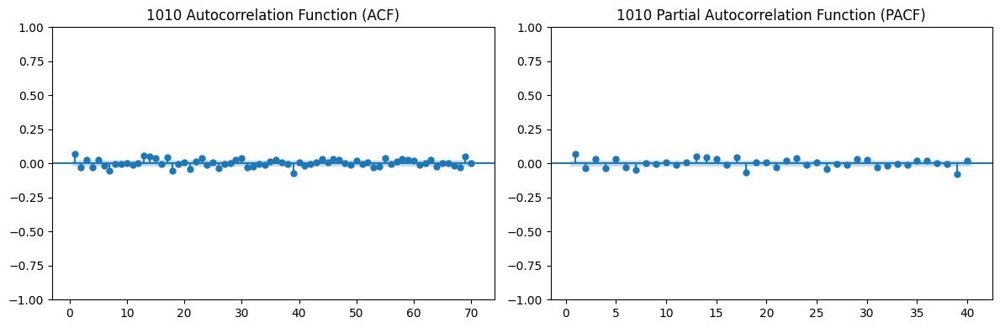

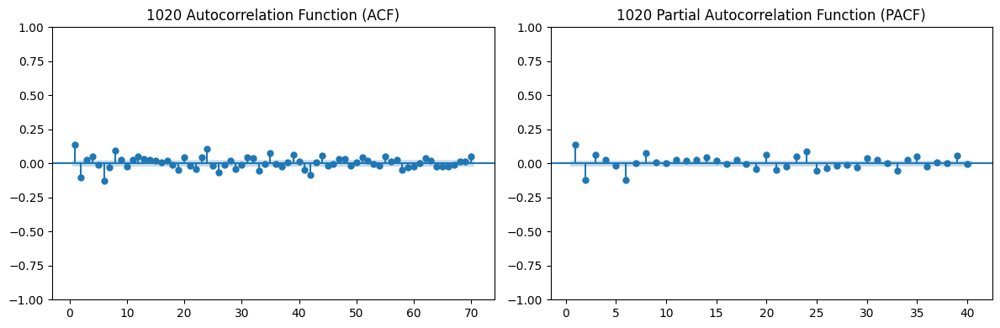

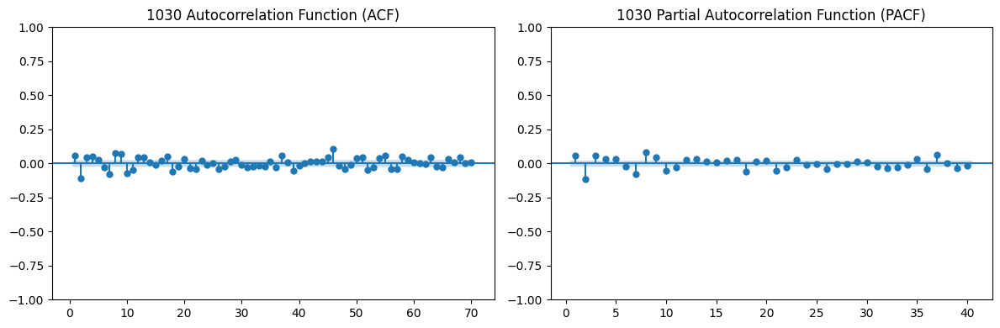

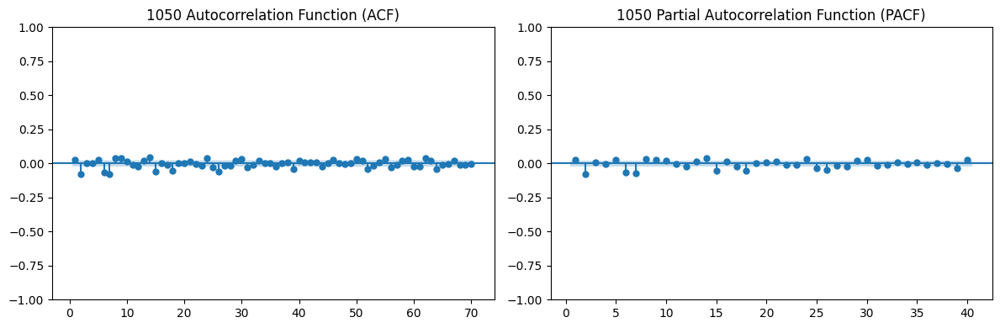

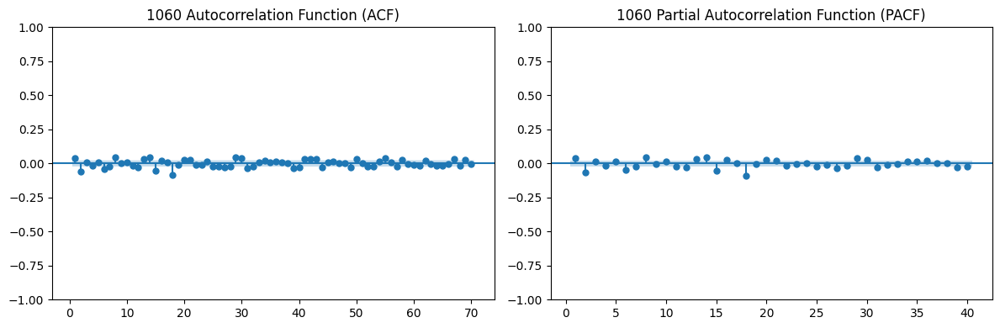

...

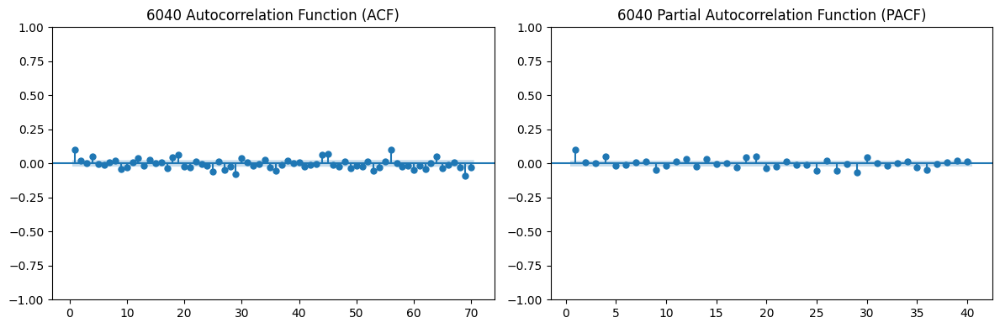

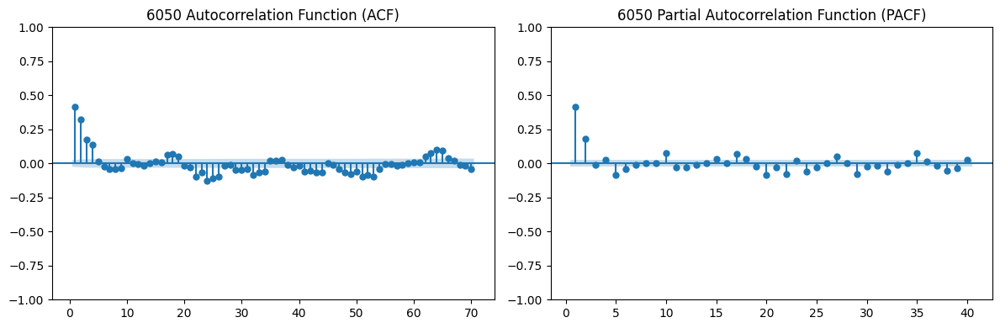

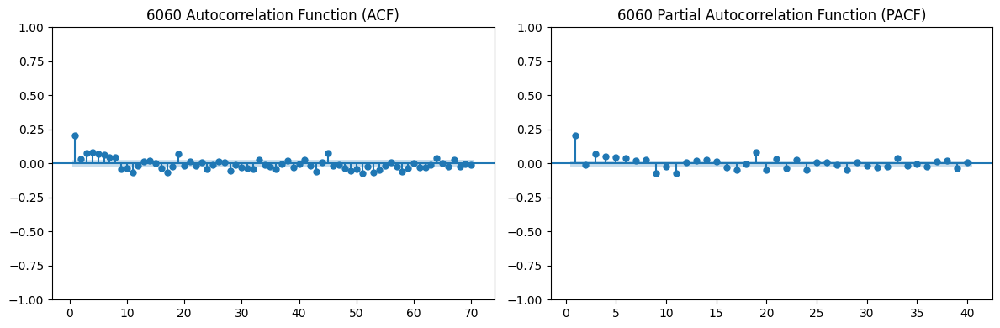

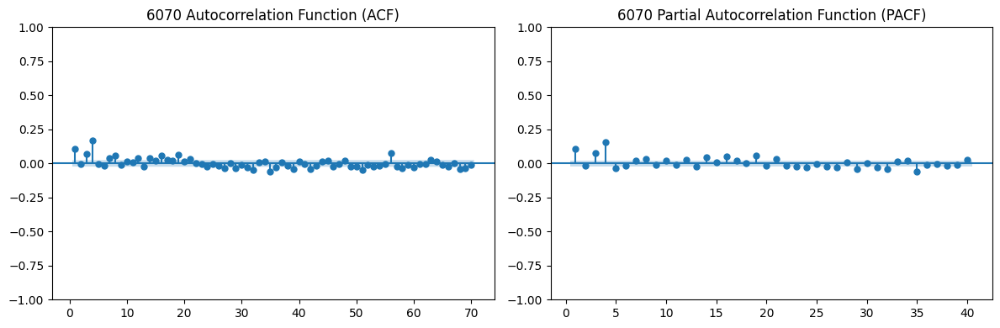

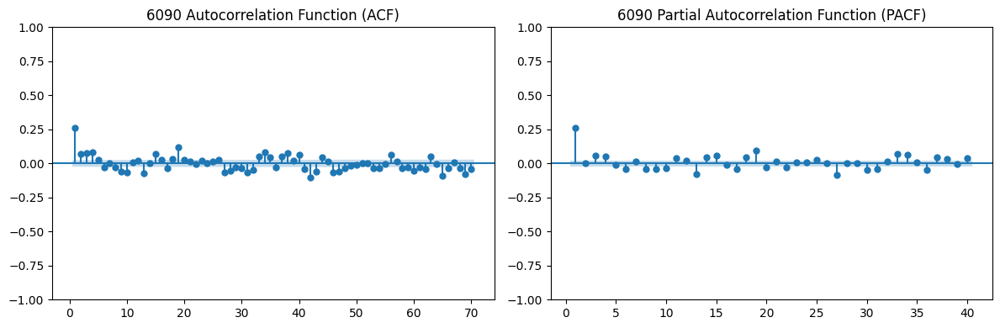

In [ ]:
from statsmodels.graphics.tsaplots import plot_acf
from statsmodels.graphics.tsaplots import plot_pacf


def get_plot_acf_df(stock_symbol, new_df):
    diff_series = new_df[new_df['tiker'] == stock_symbol]["close"]
    # .diff(2).dropna()

    # Plot ACF and PACF
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 4))
    plot_acf(diff_series, lags=70, zero=False, ax=ax1)
    ax1.set_title(str(stock_symbol) + " Autocorrelation Function (ACF)")

    plot_pacf(diff_series, lags=40, zero=False, ax=ax2)
    ax2.set_title(str(stock_symbol) + " Partial Autocorrelation Function (PACF)")

    plt.tight_layout()
    plt.show()



# Loop through each stock for plot_acf_for_stocks
for symbol in final_stocksList:
     get_plot_acf_df(symbol, df_acf)



# ARIMA

In [ ]:
# Function to split data into training and testing for each stock
def split_data(data):
    split_date = data.index[0] - pd.DateOffset(years=2)
    train_data = data[data.index < split_date]
    test_data = data[data.index > split_date]


    return train_data, test_data


# Apply the function for each stock
train_data_list, test_data_list = [], []
for symbol in final_stocksList:
    stock_data = df_acf[df_acf['tiker'] ==symbol][[ 'close','tiker']]
    train_data_stock, test_data_stock = split_data(stock_data)
    # print('train lenght',len(train_data_stock),'test lenght',len(test_data_stock),symbol)
    train_data_list.append(train_data_stock)
    test_data_list.append(test_data_stock)







In [ ]:
train_data = pd.concat(train_data_list)
test_data = pd.concat(test_data_list)


In [ ]:
# train_data_list[0]

In [ ]:
# train_dt

In [ ]:
test_data.isnull().sum()

In [ ]:
train_data.isnull().sum()

In [ ]:
train_dt=train_data[train_data['tiker'] == '1010'][[ 'close']]


In [ ]:
test_data.index[0]

In [ ]:
test_data.index[-1]

In [ ]:
train_data.index[0]

In [ ]:
train_dt.head()

In [ ]:
from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.tsa.arima.model import ARIMA

In [ ]:
# Train ARIMA models for each stock

counter_problem=0
def fit_arima(timeseries):
    model = ARIMA(timeseries, order=(2, 1, 1))
    model_fit = model.fit()
#     model_fit = model.fit(maxiter=1000)
    return model_fit

arima_models = {}
for symbol in final_stocksList:
    train_dt = train_data[train_data['tiker']== symbol][['close']]
    rain1_reindex = train_dt.reindex(index=pd.date_range(start=train_dt.index[-1], end=train_dt.index[0], freq='D'), columns=train_dt.columns)

    model_fit = fit_arima(rain1_reindex)

    if not model_fit.mle_retvals['converged']:
        print(f"Model for {symbol} did not converge: {model_fit.mle_retvals}")
        counter_problem=counter_problem+1
    arima_models[symbol] = model_fit
    # arima_models[symbol] = fit_arima(rain1_reindex)

In [ ]:
train_dt = train_data[train_data['tiker']== symbol][['close']]
rain1_reindex = train_dt.reindex(index=pd.date_range(start=train_dt.index[-1], end=train_dt.index[0], freq='D'), columns=train_dt.columns)


In [ ]:
from sklearn.metrics import mean_squared_error, mean_absolute_error
import matplotlib.pyplot as plt

testtock1010 = test_data[test_data['tiker'] == '1010'][['close']]
traintock1010 = train_data[train_data['tiker'] == '1010'][['close']]

# Use the ARIMA model to forecast the same length as the test data
fcast_len = len(testtock1010)
fcast = arima_models['1010'].forecast(steps=fcast_len)

mse = mean_squared_error(testtock1010, fcast)
rmse = np.sqrt(mse)
mae = mean_absolute_error(testtock1010, fcast)

plt.figure(figsize=(20, 10))
plt.title(' Production Forecast', fontsize=30)
plt.plot(traintock1010, label='Train')
plt.plot(fcast, label='Forecast')
plt.plot(testtock1010, label='Test')

print(f'Mean Squared Error: {mse}')
print(f'Root Mean Squared Error: {rmse}')
print(f'Mean Absolute Error: {mae}')
plt.legend(fontsize=25)
plt.show()


In [ ]:
fcast

In [ ]:

testtock1010 = test_data[test_data['tiker'] == '1010'][['close']]
traintock1010 = train_data[train_data['tiker'] == '1010'][['close']]

# Use the ARIMA model to forecast the same length as the test data
fcast_len = len(testtock1010)
fcast = arima_models['1010'].forecast(steps=fcast_len)

mse = mean_squared_error(testtock1010, fcast)
rmse = np.sqrt(mse)
mae = mean_absolute_error(testtock1010, fcast)

plt.figure(figsize=(16, 8))
plt.title('  Stock Forecast', fontsize=30)
plt.plot(traintock1010, label='Train')
plt.plot(fcast, label='Forecast')
plt.plot(testtock1010, label='Test')

print(f'Mean Squared Error: {mse}')
print(f'Root Mean Squared Error: {rmse}')
print(f'Mean Absolute Error: {mae}')
plt.legend(fontsize=25)
plt.show()


KeyError: '1010'

# **LSTM**

In [ ]:
from sklearn.preprocessing import MinMaxScaler
from keras.models import Sequential
from keras.layers import Dense, LSTM

In [ ]:
df_ٍLSTM=pd.read_csv(filename)

In [ ]:

df_ٍLSTM.sort_index(ascending=False,inplace=True)

df_ٍLSTM['tiker'] = df_ٍLSTM['tiker'].astype(str)
df_ٍLSTM.set_index('date', inplace=True)

In [ ]:
lst_stock=df_ٍLSTM['tiker'].unique().tolist()

In [ ]:
def train_lstm_model(df_lstm, symbol):
    # Create a new dataframe with only the 'Close' column for the specified stock symbol
    data = df_lstm[df_lstm['tiker'] == symbol][['close']]
    dataset = data.values


    training_data_len = int(np.ceil(len(dataset) * 0.90))

    scaler = MinMaxScaler(feature_range=(0, 1))
    scaled_data = scaler.fit_transform(dataset)

    train_data = scaled_data[0:int(training_data_len), :]
    x_train, y_train = [], []

    for i in range(60, len(train_data)):
        x_train.append(train_data[i-60:i, 0])
        y_train.append(train_data[i, 0])

    x_train, y_train = np.array(x_train), np.array(y_train)
    x_train = np.reshape(x_train, (x_train.shape[0], x_train.shape[1], 1))

    model = Sequential()
    model.add(LSTM(128, return_sequences=True, input_shape=(x_train.shape[1], 1)))
    model.add(LSTM(64, return_sequences=False))
    model.add(Dense(25))
    model.add(Dense(1))

    model.compile(optimizer='adam', loss='mean_squared_error')
    model.fit(x_train, y_train, batch_size=1, epochs=1)

    test_data = scaled_data[training_data_len - 60:, :]
    x_test = []
    y_test = dataset[training_data_len:, :]
    for i in range(60, len(test_data)):
        x_test.append(test_data[i-60:i, 0])

    x_test = np.array(x_test)
    x_test = np.reshape(x_test, (x_test.shape[0], x_test.shape[1], 1))

    predictions = model.predict(x_test)
    predictions = scaler.inverse_transform(predictions)
    rmse = np.sqrt(np.mean(((predictions - y_test) ** 2)))


    # Plot the data
 # Plot the data
    train_t = data[:training_data_len]
    valid_t = data[training_data_len:]
    valid_t['Predictions'] = predictions

# Convert index to datetime format
    train_t.index = pd.to_datetime(train_t.index)
    valid_t.index = pd.to_datetime(valid_t.index)

# Visualize the data
    plt.figure(figsize=(16,6))
    plt.title('Model')
    plt.xlabel('Date', fontsize=18)
    plt.ylabel('Close Price', fontsize=18)
    plt.plot(train_t.index, train_t['close'])
    plt.plot(valid_t.index, valid_t['close'])
    plt.plot(valid_t.index, valid_t['Predictions'])
    plt.legend(['Train', 'Val', 'Predictions'], loc='lower right')
    plt.show()


    # Plotting the predictions

    return model, scaler


24/24 [==============================] - 1s 18ms/step


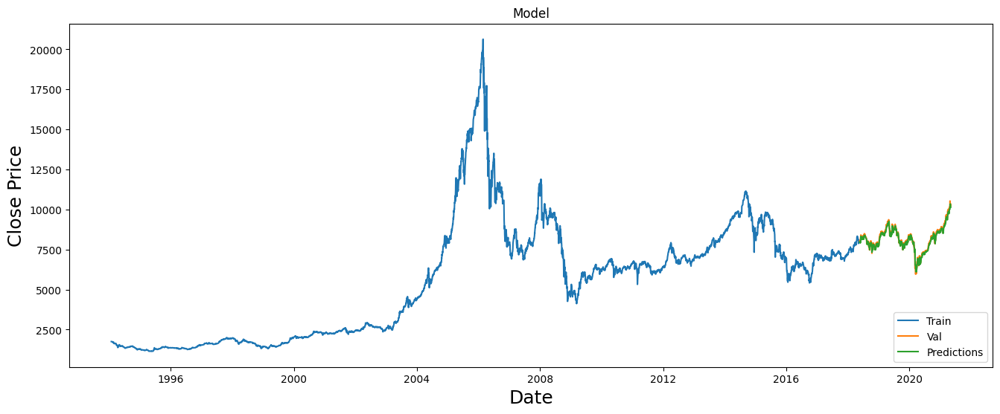

13/13 [==============================] - 1s 20ms/step


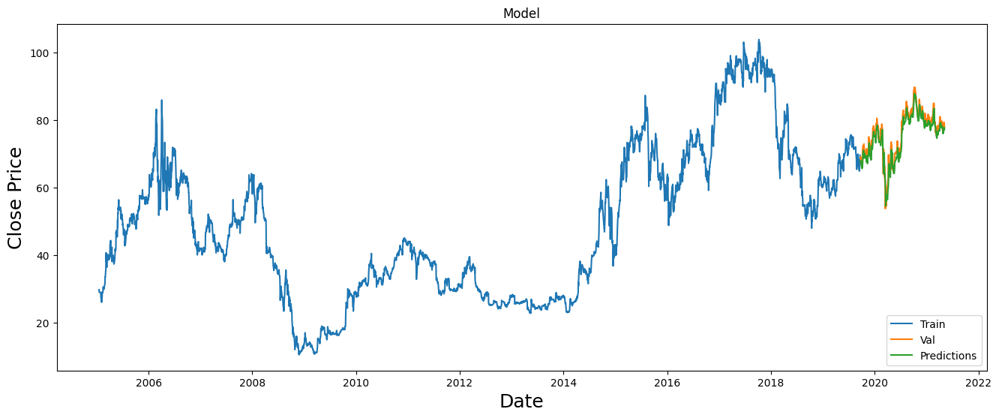

13/13 [==============================] - 1s 38ms/step


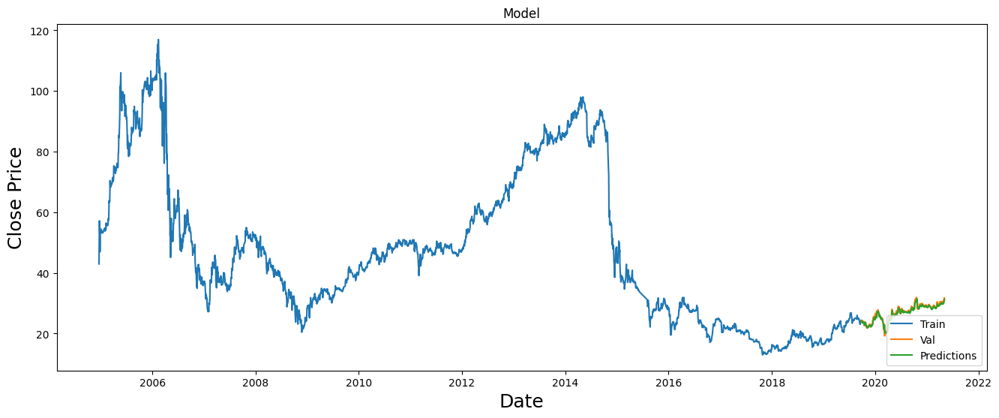

15/15 [==============================] - 1s 20ms/step


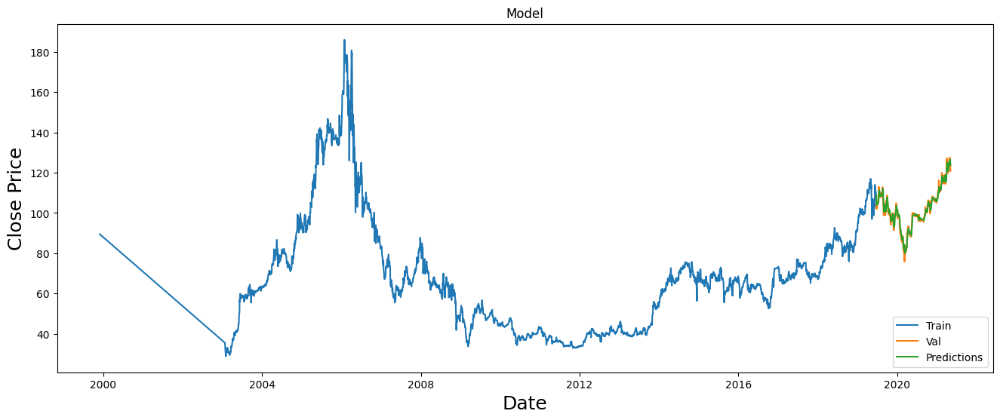

22/22 [==============================] - 1s 20ms/step


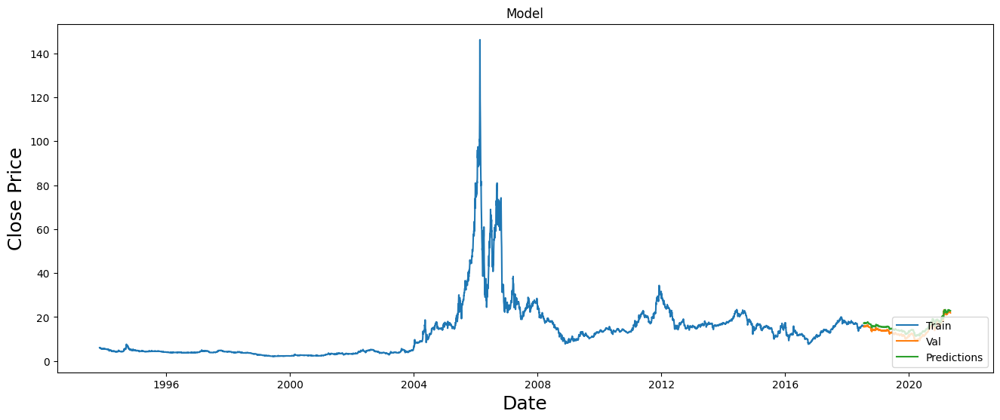

23/23 [==============================] - 1s 20ms/step


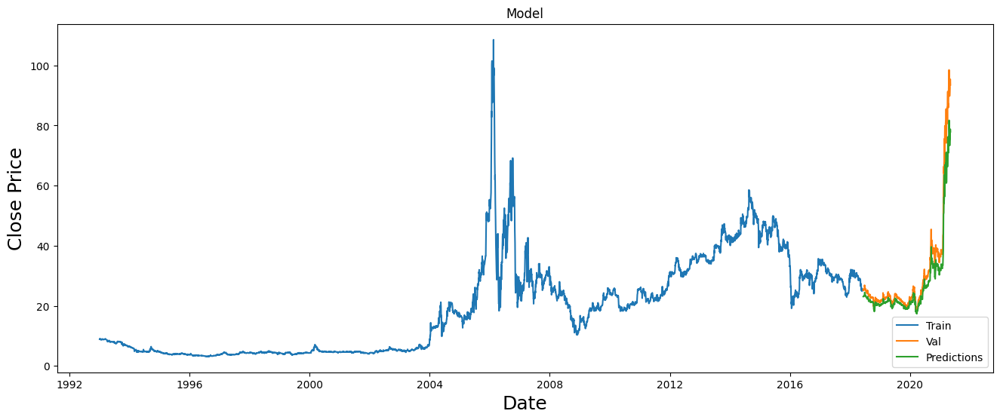

22/22 [==============================] - 1s 21ms/step


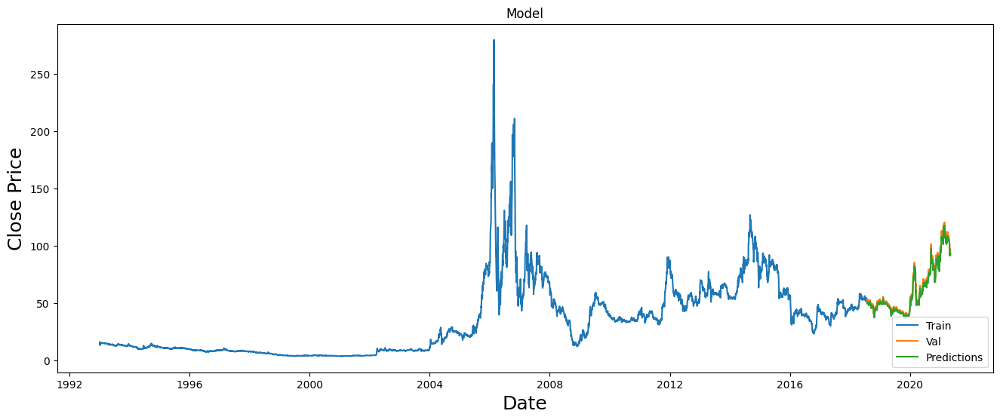

20/20 [==============================] - 1s 21ms/step


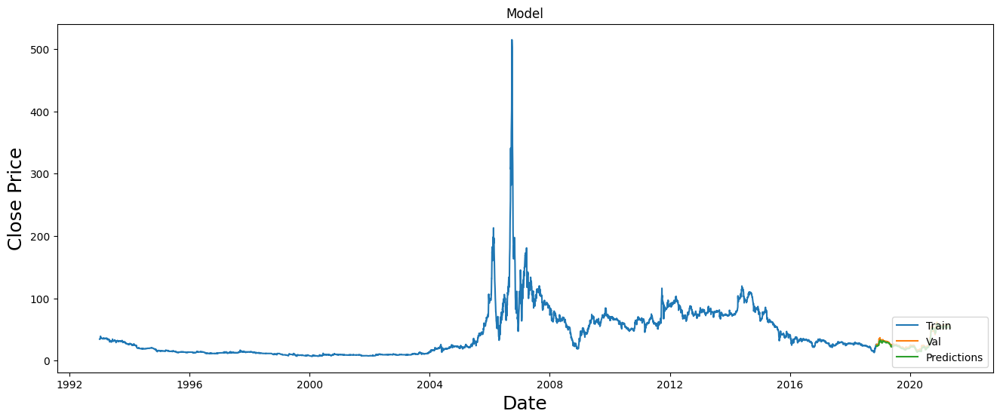

22/22 [==============================] - 1s 21ms/step


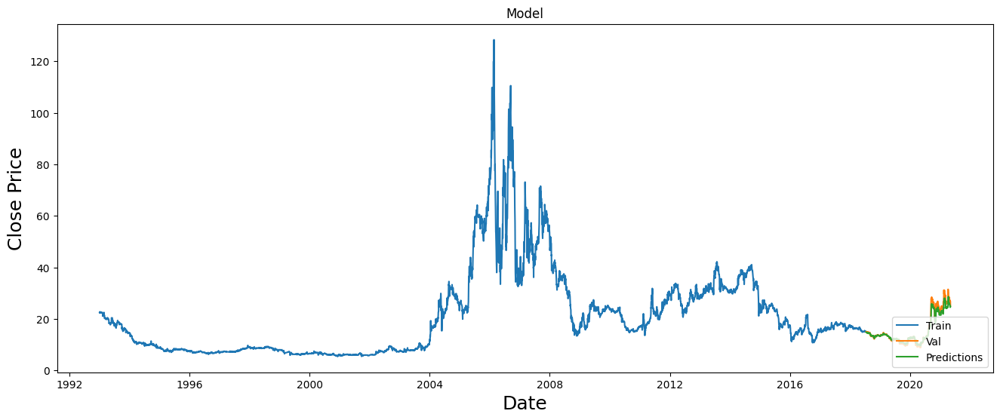

24/24 [==============================] - 1s 26ms/step


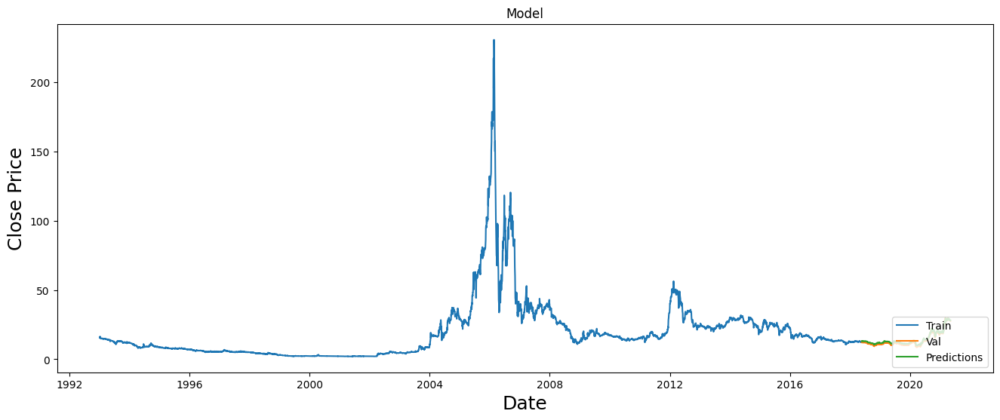

23/23 [==============================] - 1s 20ms/step


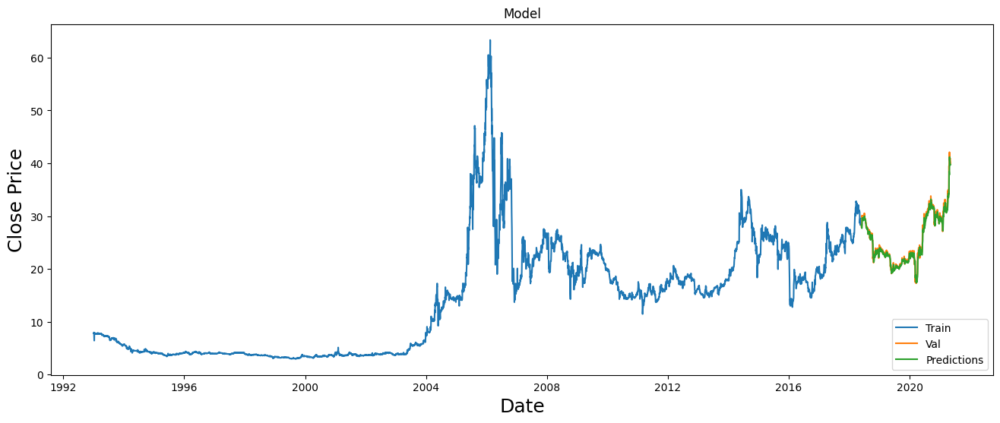

16/16 [==============================] - 1s 21ms/step


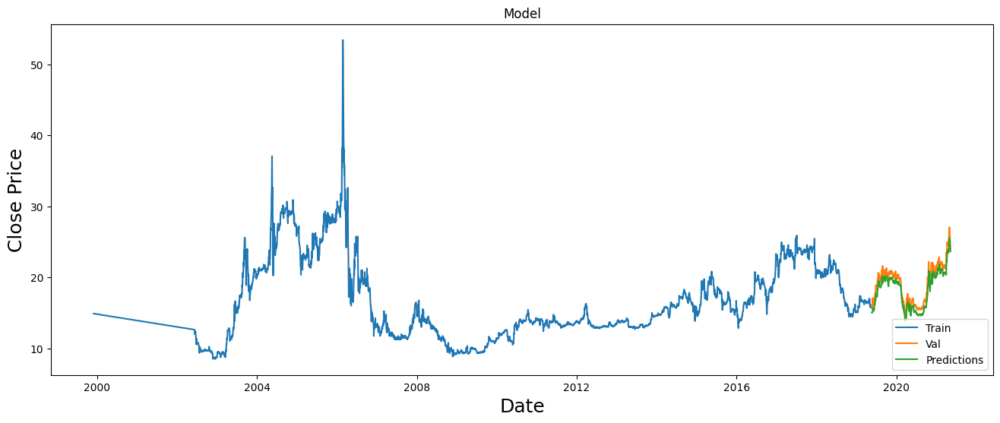

12/12 [==============================] - 1s 22ms/step


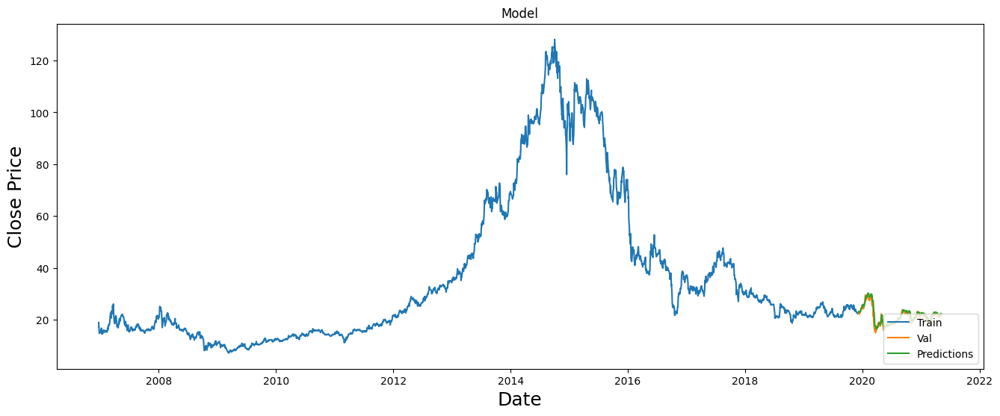

12/12 [==============================] - 1s 23ms/step


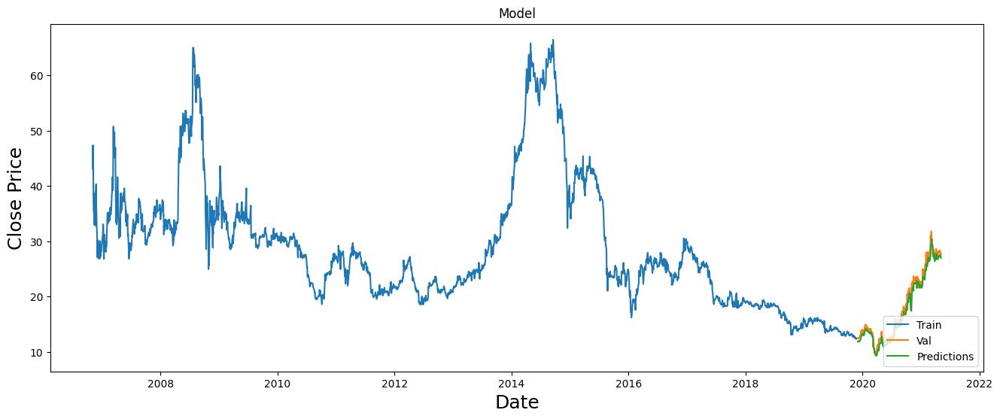

12/12 [==============================] - 1s 22ms/step


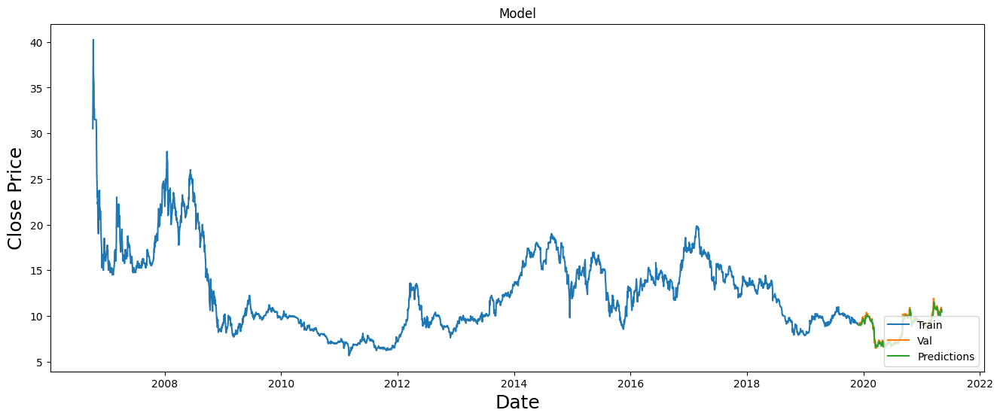

12/12 [==============================] - 1s 22ms/step


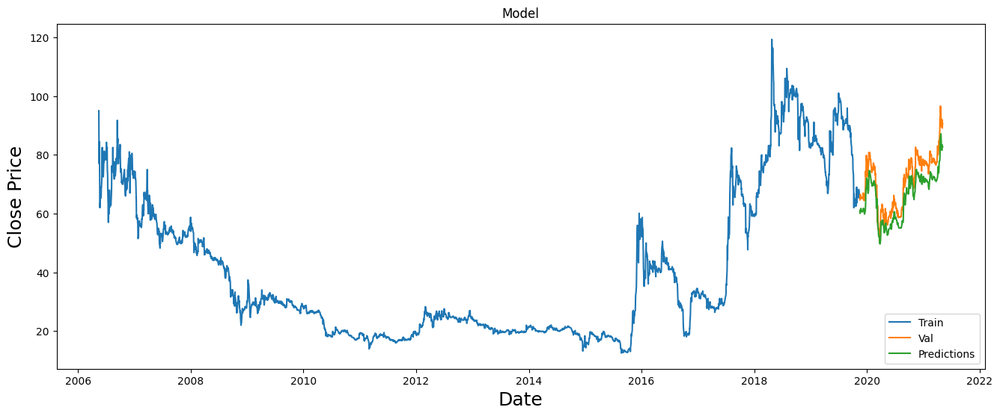

12/12 [==============================] - 1s 39ms/step


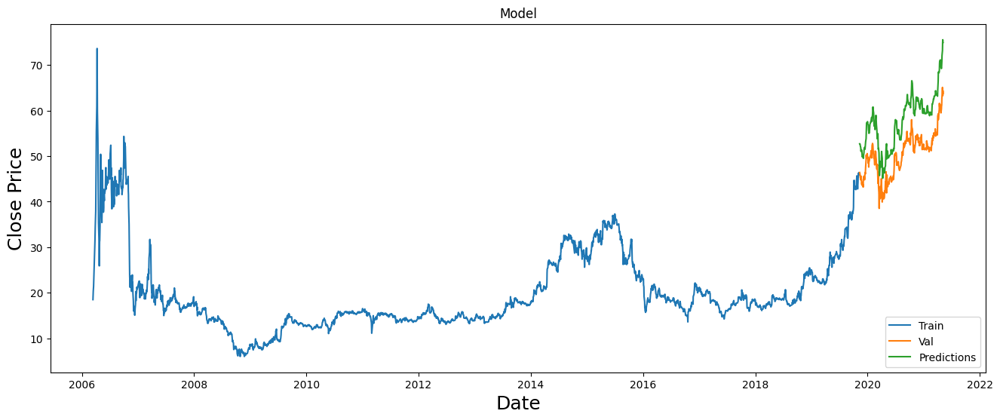

14/14 [==============================] - 1s 23ms/step


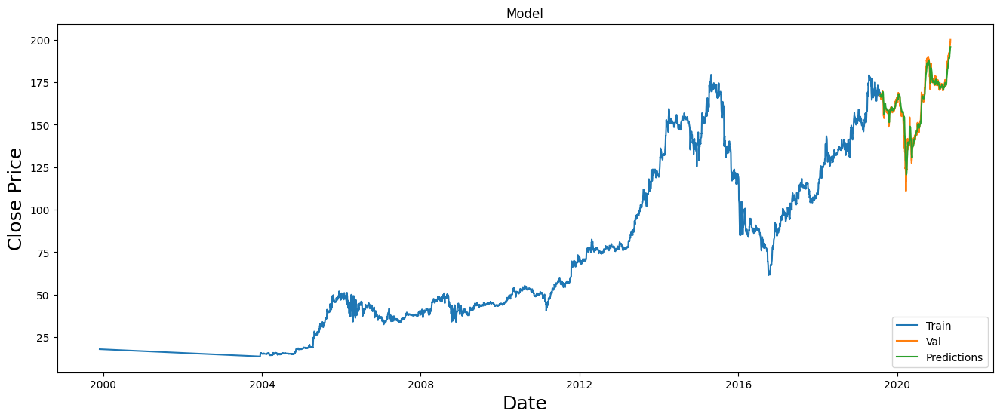

15/15 [==============================] - 1s 24ms/step


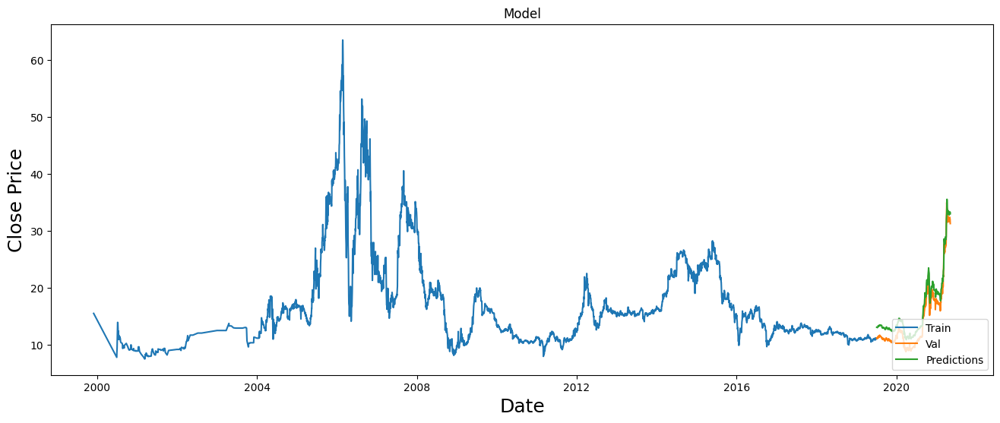

17/17 [==============================] - 1s 22ms/step


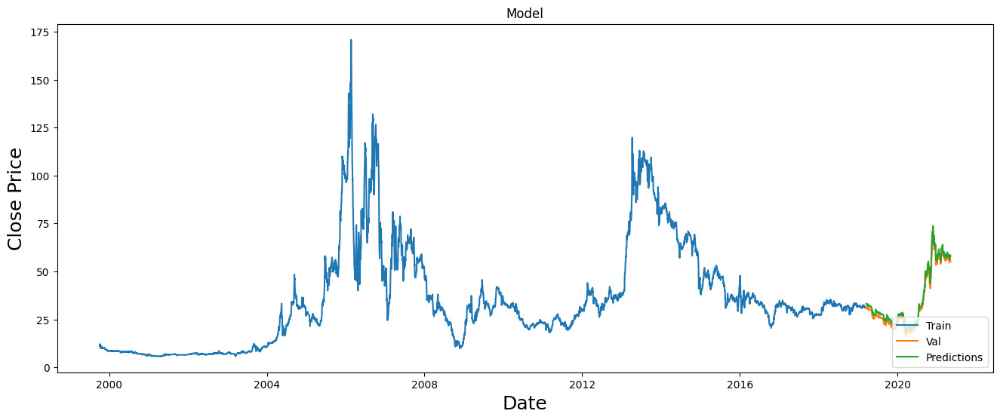

23/23 [==============================] - 1s 26ms/step


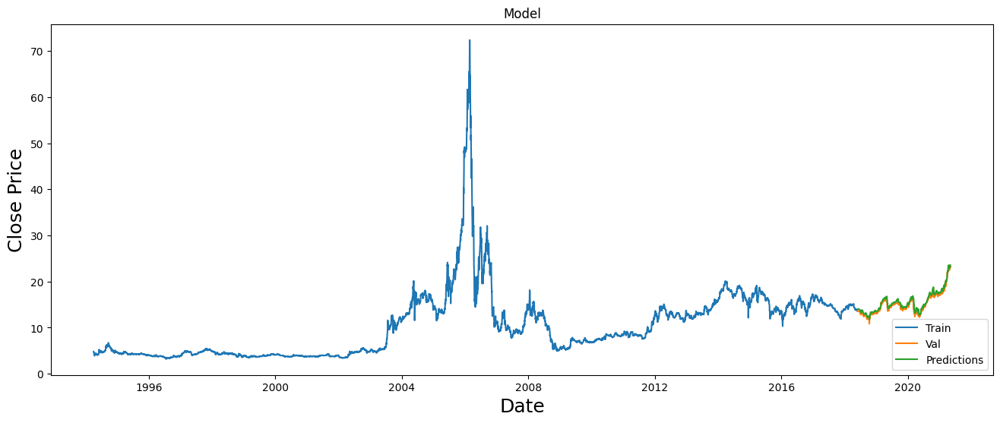

18/18 [==============================] - 1s 27ms/step


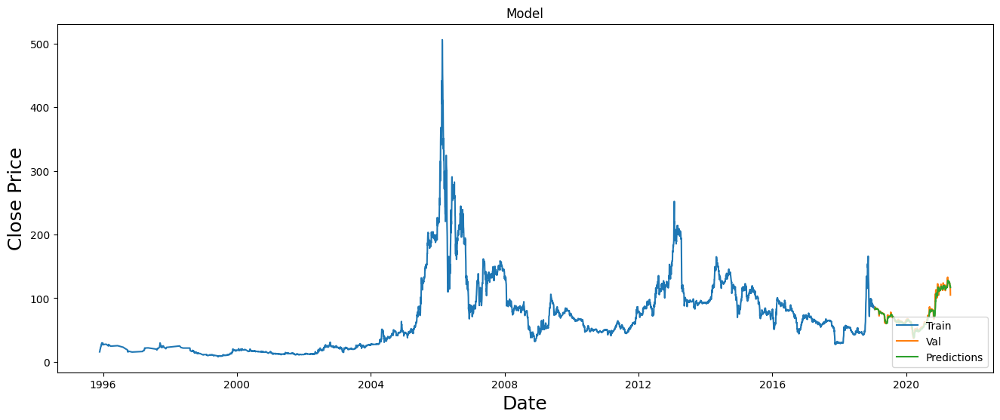

20/20 [==============================] - 1s 23ms/step


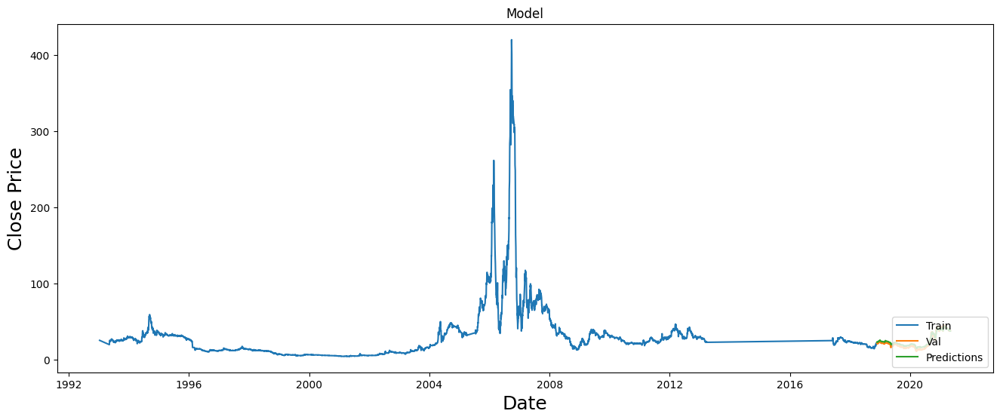

24/24 [==============================] - 1s 24ms/step


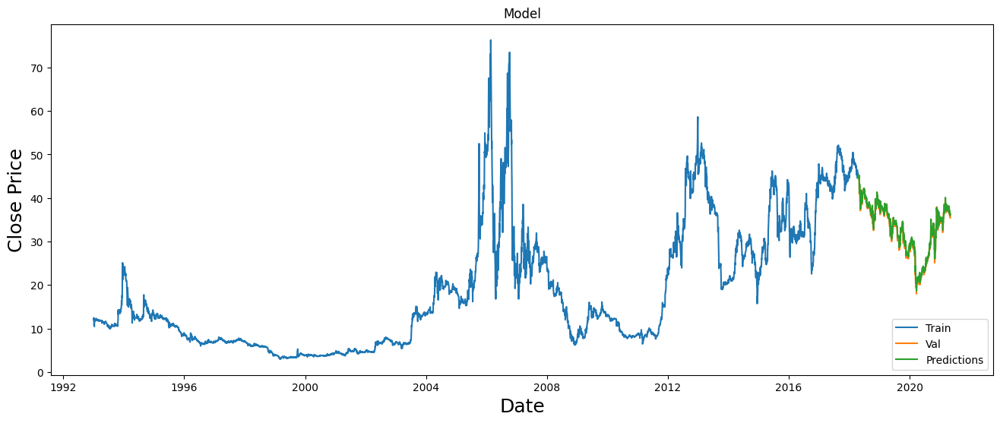

24/24 [==============================] - 1s 30ms/step


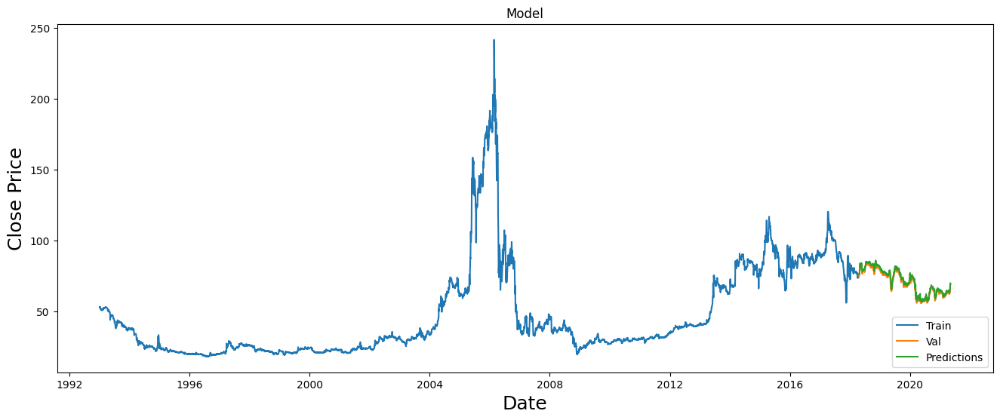

24/24 [==============================] - 2s 39ms/step


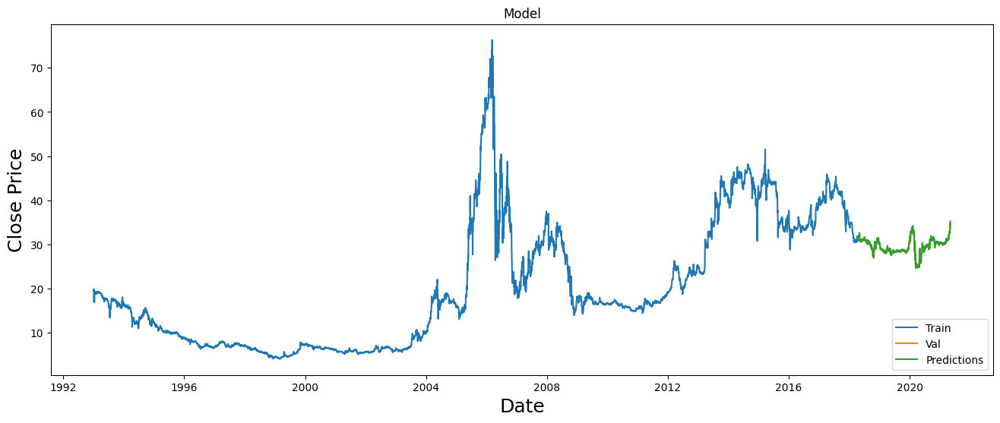

23/23 [==============================] - 1s 27ms/step


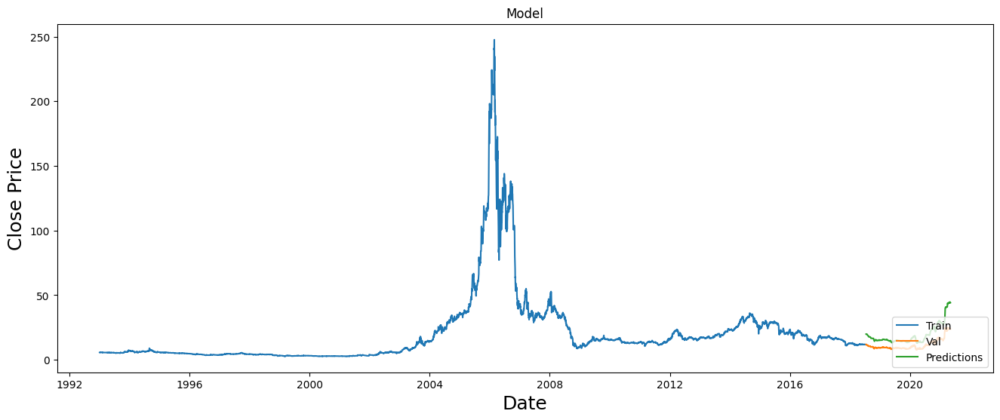

19/19 [==============================] - 1s 27ms/step


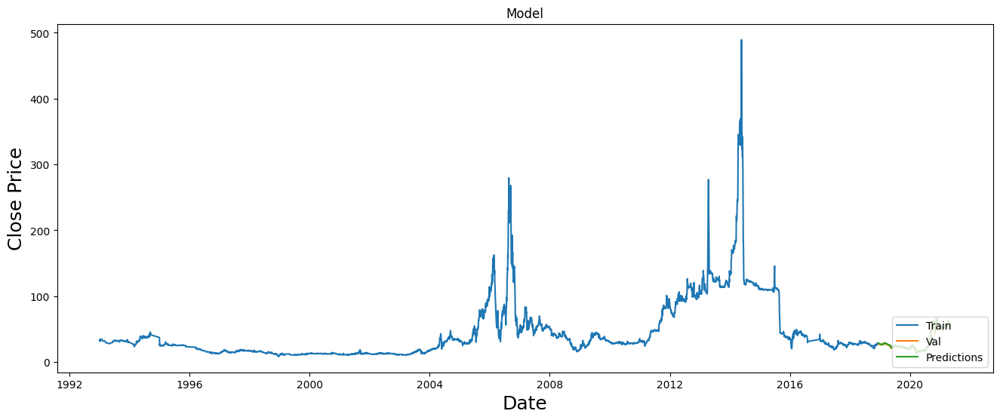

20/20 [==============================] - 1s 26ms/step


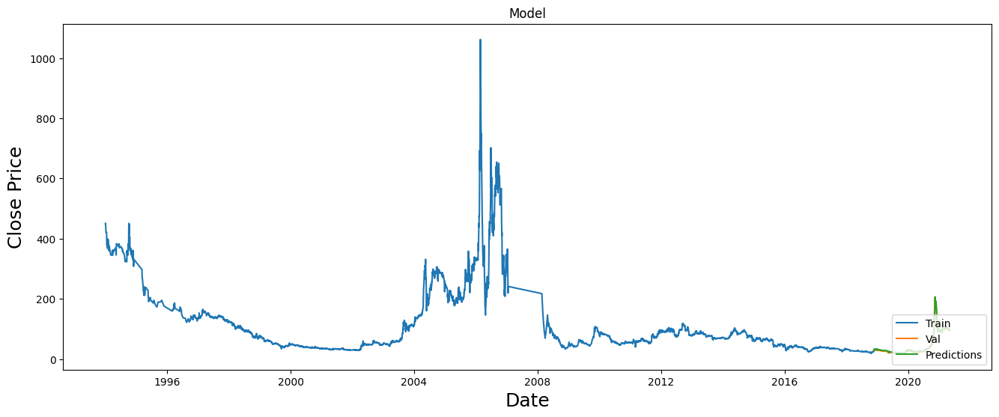

24/24 [==============================] - 1s 26ms/step


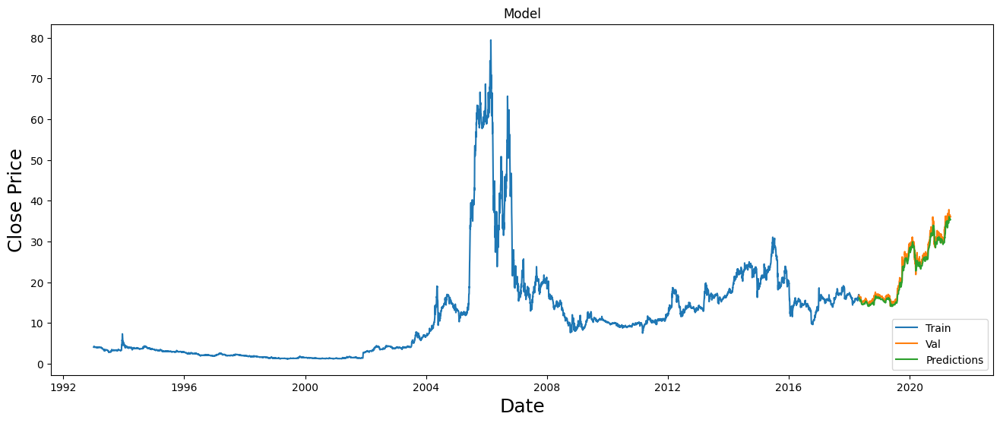

24/24 [==============================] - 1s 27ms/step


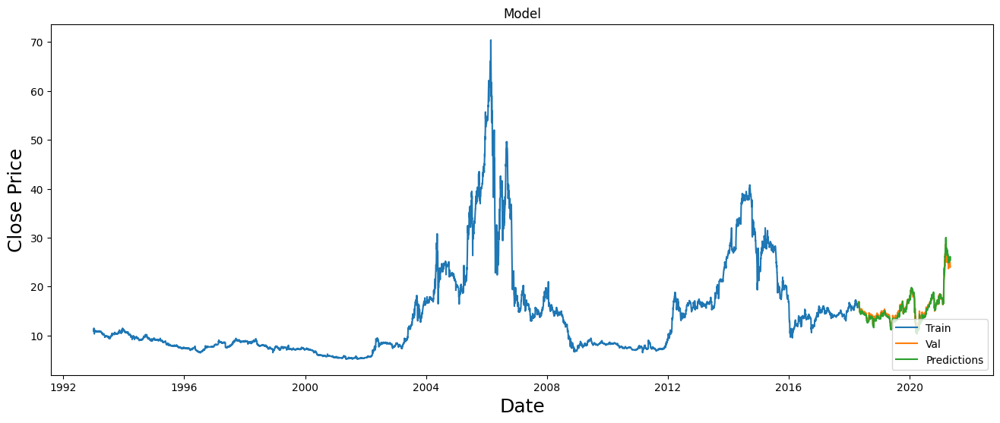

24/24 [==============================] - 1s 28ms/step


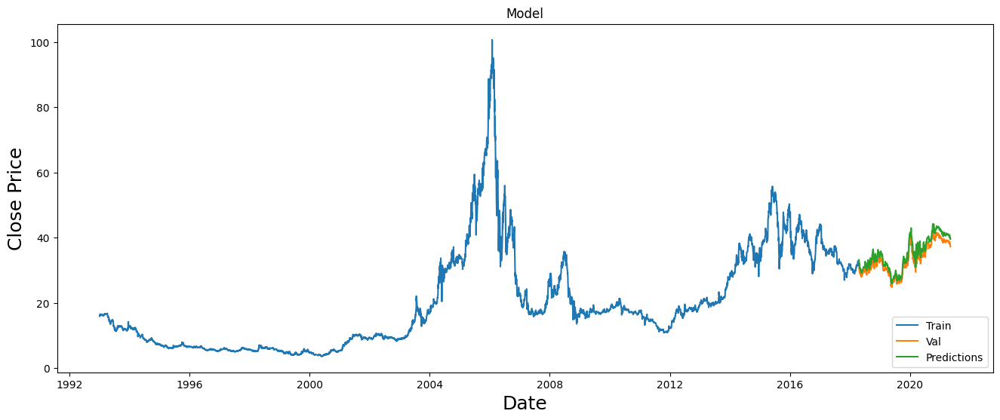

21/21 [==============================] - 1s 27ms/step


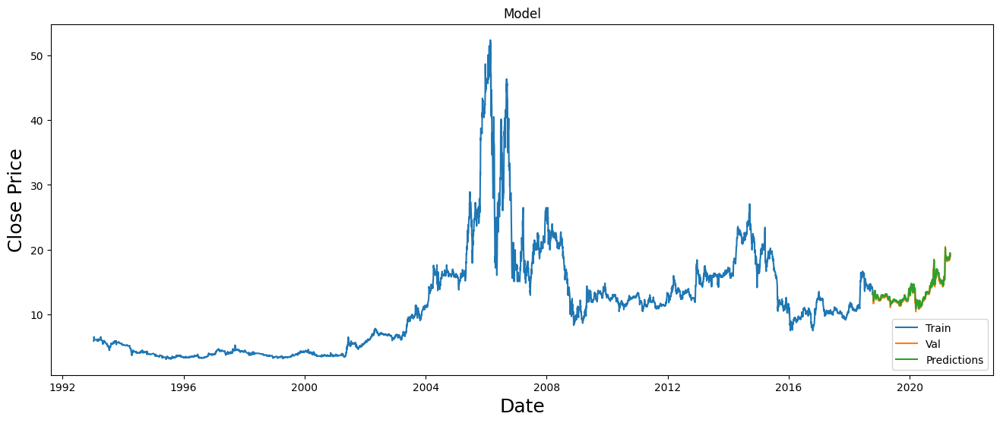

21/21 [==============================] - 1s 28ms/step


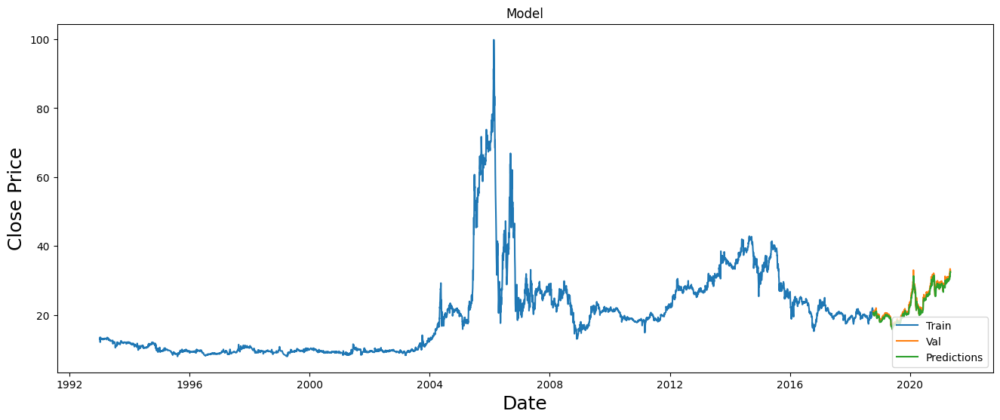

23/23 [==============================] - 1s 30ms/step


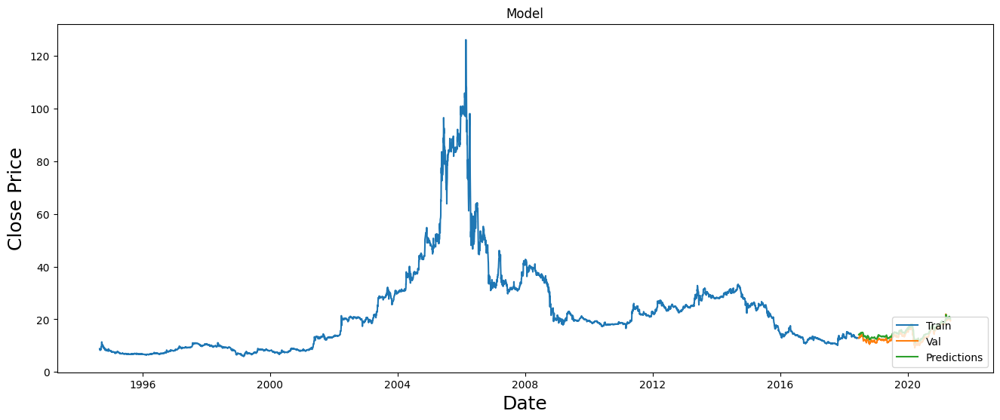

24/24 [==============================] - 1s 27ms/step


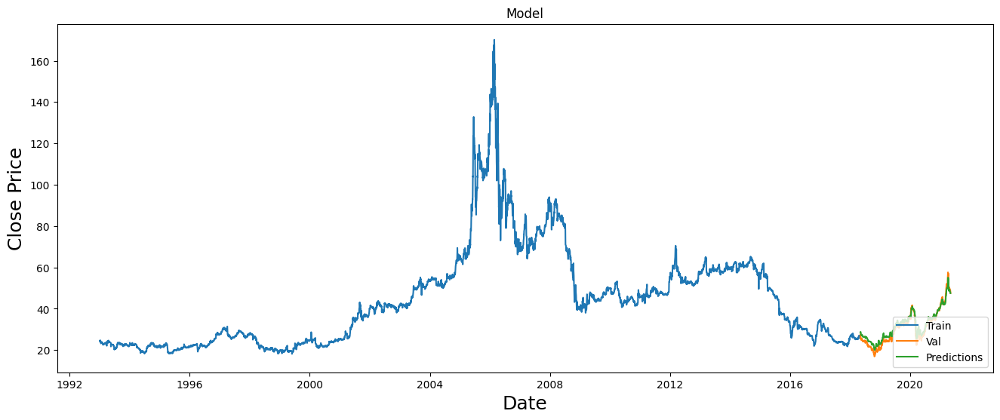

24/24 [==============================] - 1s 35ms/step


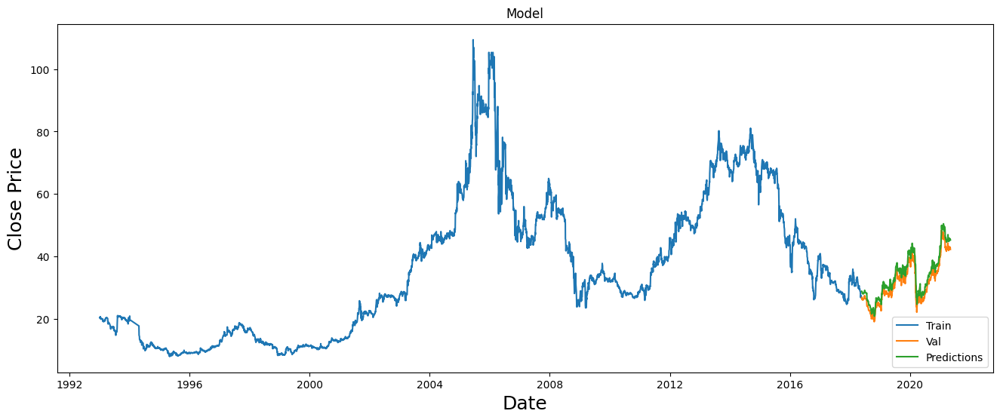

23/23 [==============================] - 1s 28ms/step


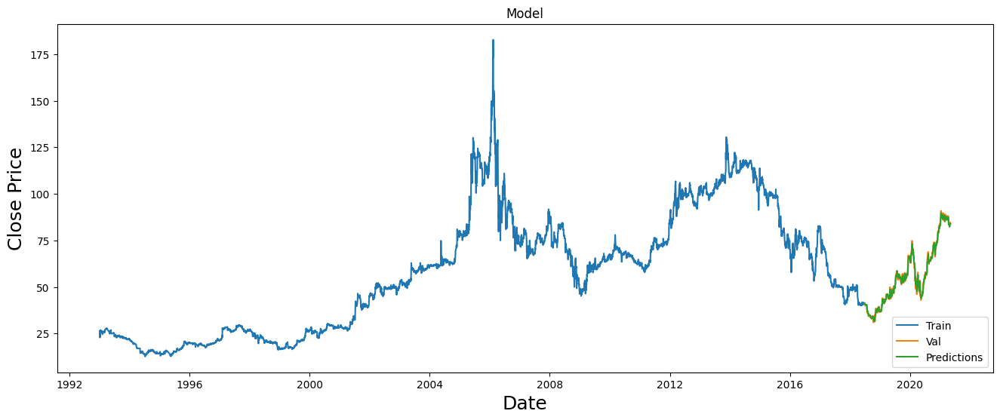

23/23 [==============================] - 1s 31ms/step


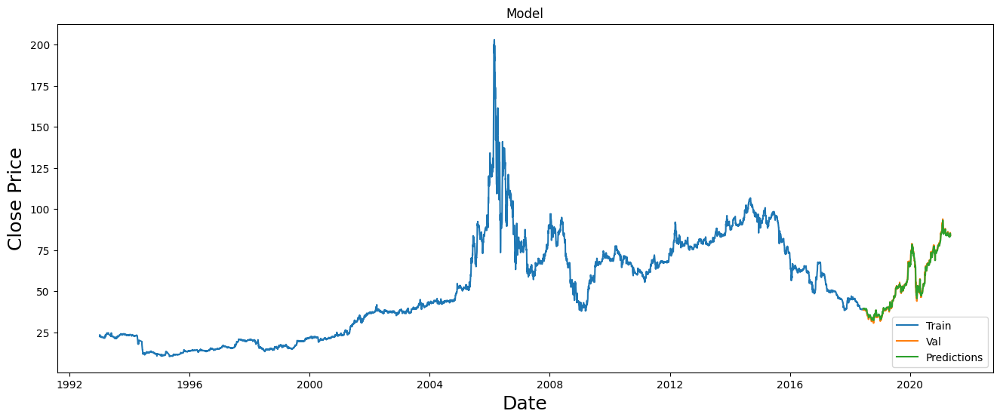

24/24 [==============================] - 1s 28ms/step


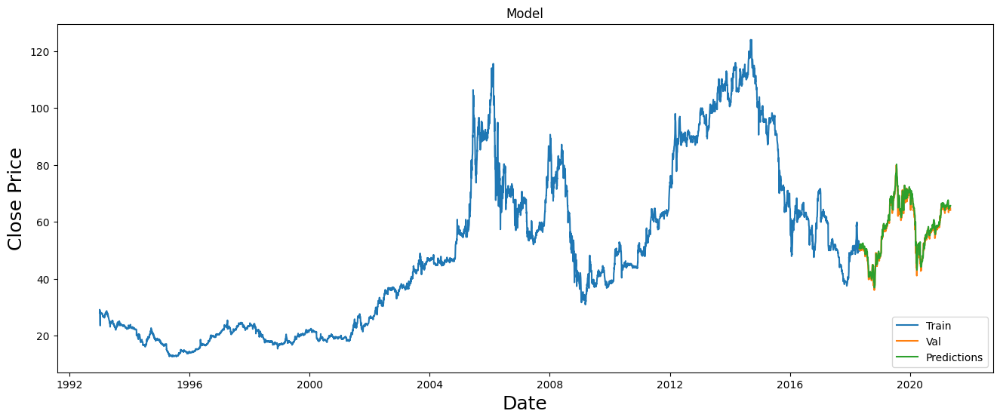

23/23 [==============================] - 1s 28ms/step


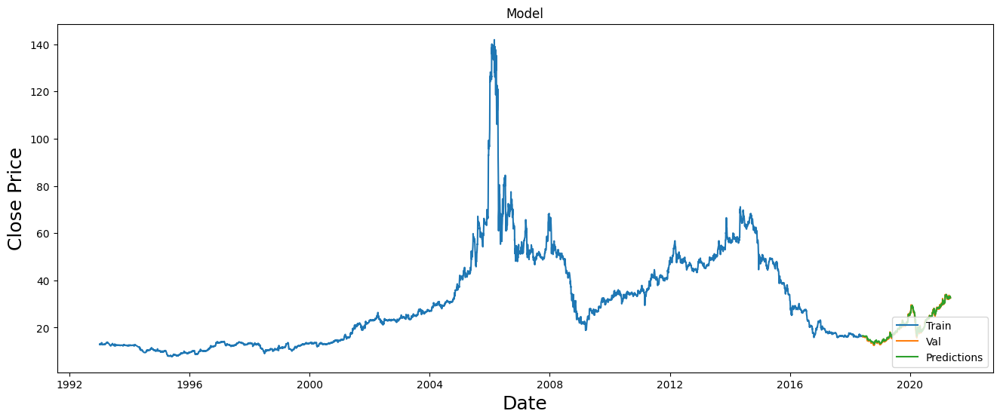

23/23 [==============================] - 1s 29ms/step


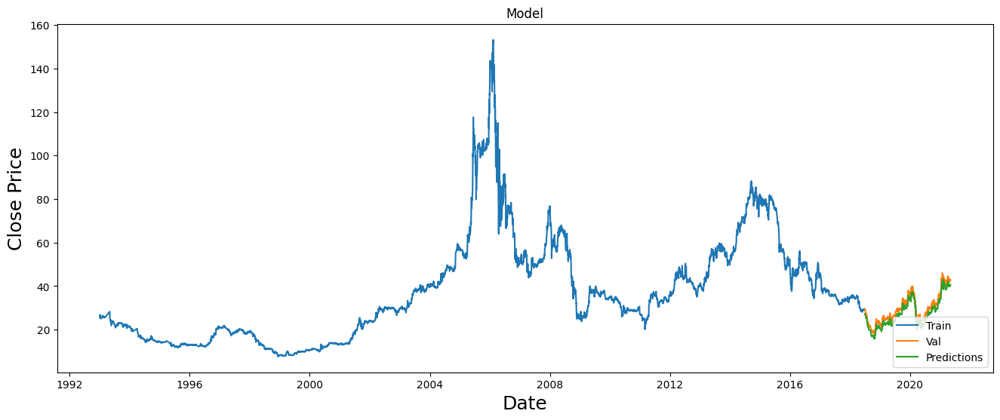

12/12 [==============================] - 1s 28ms/step


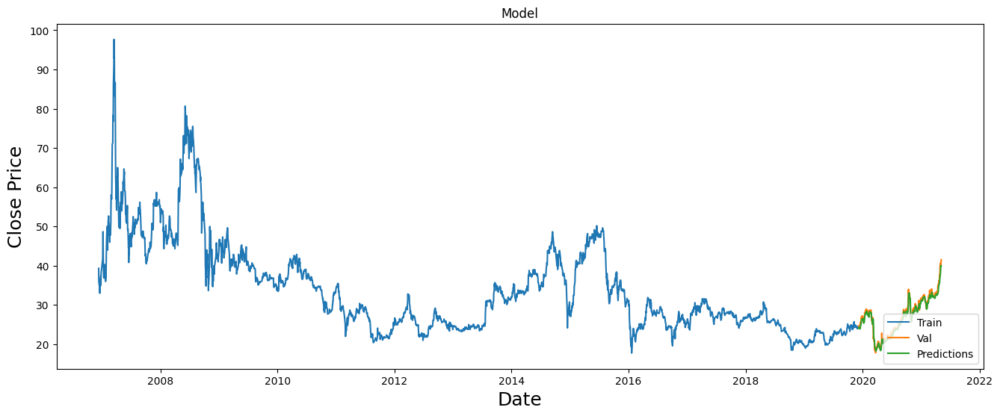

12/12 [==============================] - 1s 28ms/step


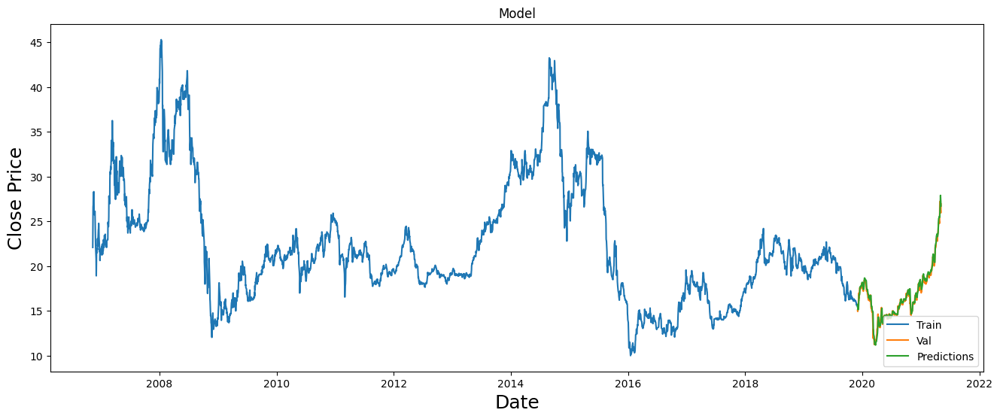

12/12 [==============================] - 1s 28ms/step


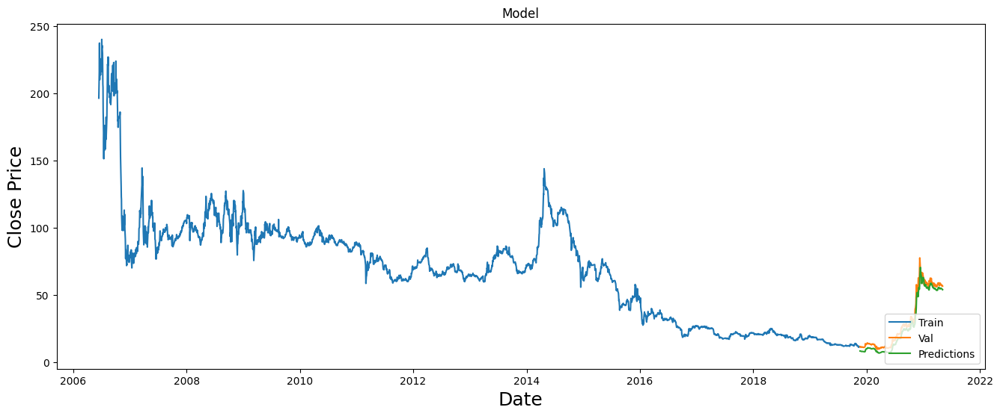

12/12 [==============================] - 1s 30ms/step


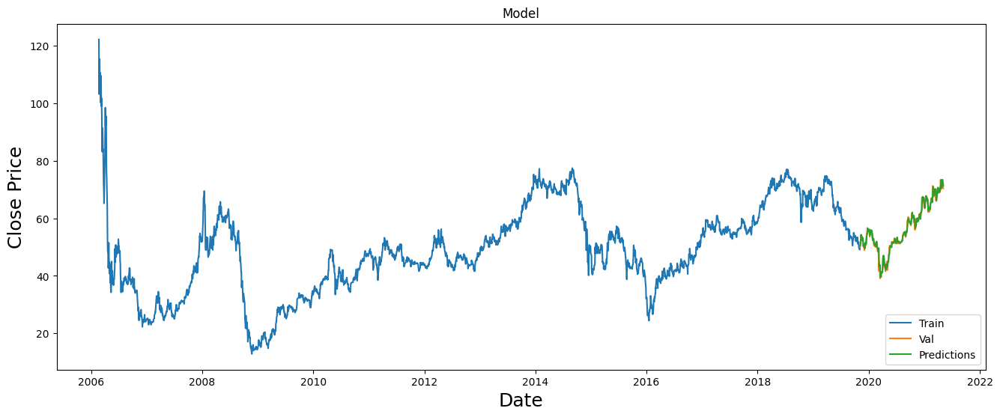

13/13 [==============================] - 1s 34ms/step


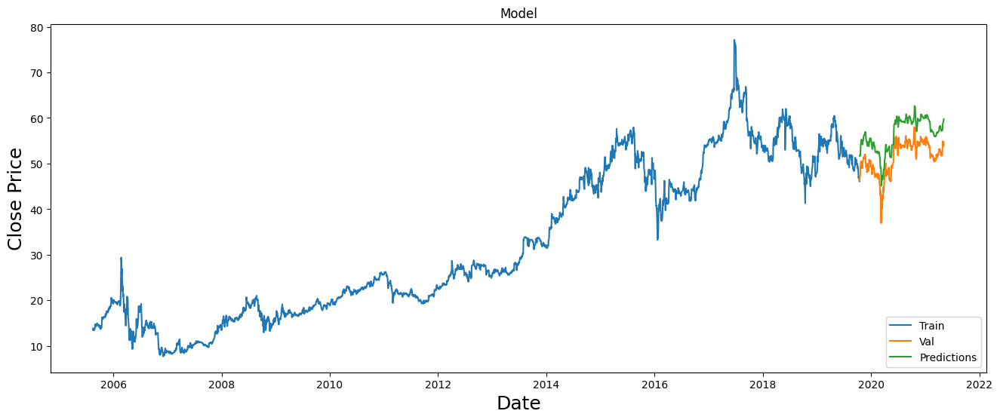

13/13 [==============================] - 1s 30ms/step


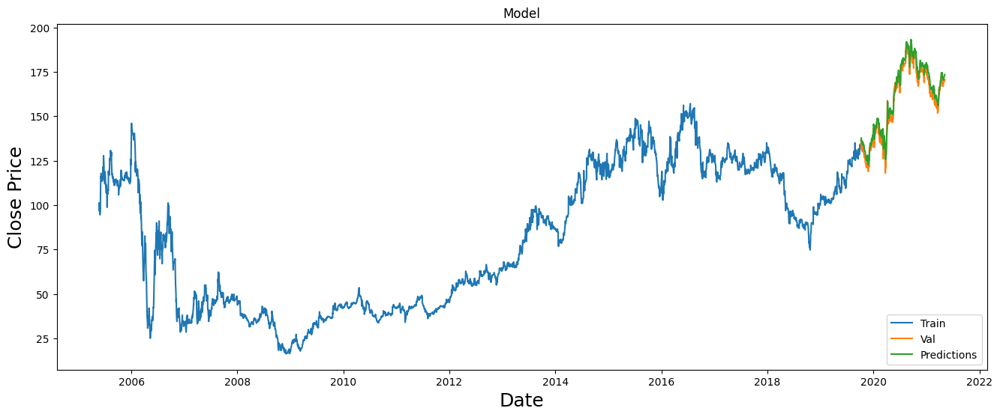

14/14 [==============================] - 1s 36ms/step


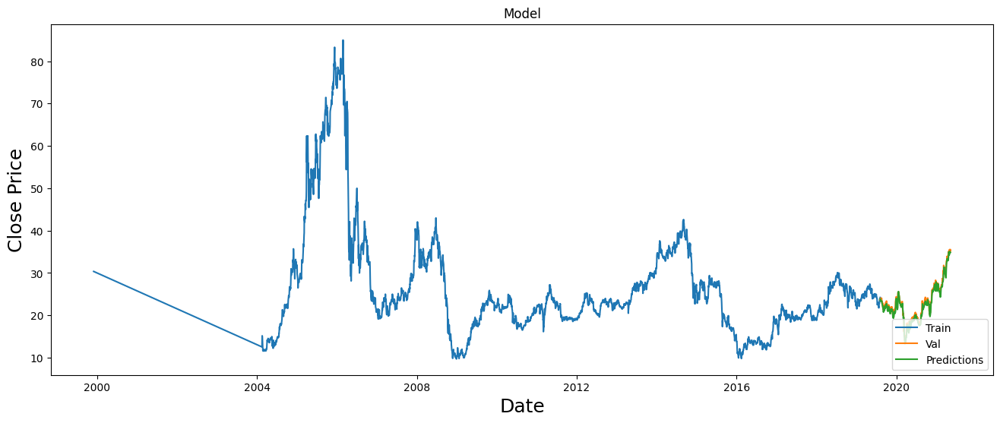

2512/3801 [==================>...........] - ETA: 1:05 - loss: 0.0016

In [ ]:
models = {}

for symbol in lst_stock:
    model, scaler = train_lstm_model(df_ٍLSTM, symbol)
    models[symbol] = (model, scaler)

# Save all models and scalers to a single file
# joblib.dump(models, 'stock_models.pkl')

# SVR

In [ ]:
df_ٍSVR=pd.read_csv(filename)

In [ ]:
f_ٍSVR=pd.read_csv(filename)
df_ٍSVR.sort_index(ascending=False,inplace=True)

df['tiker'] = df['tiker'].astype(str)
#set datetime as dataset index
df_ٍSVR.set_index('date', inplace=True)

In [ ]:
df_ٍSVR

,tiker,open,high,low,close,volume
date,,,,,,
1994-01-26,TASI,1751.71,1751.71,1751.71,1751.71,312907
1994-01-29,TASI,1751.71,1750.91,1750.91,1750.91,204831
1994-01-30,TASI,1750.91,1752.59,1752.59,1752.59,180425
1994-01-31,TASI,1752.59,1752.26,1752.26,1752.26,212105
1994-02-01,TASI,1752.26,1749.70,1749.70,1749.70,176595
...,...,...,...,...,...,...
2021-05-02,1010,26.20,26.40,25.90,25.90,1087119
2021-05-03,1010,25.90,25.90,25.45,25.45,745641
2021-05-04,1010,25.50,25.60,24.76,24.90,1935432


In [ ]:

final_stocksList = df_ٍSVR['tiker'].unique()

In [ ]:
from sklearn.svm import SVR
from matplotlib.dates import DateFormatter
import matplotlib.pyplot as plt

def train_and_plot_svr(df_stock):
    forecast_days = 7
    df_stock['Prediction'] = df_stock['close'].shift(-forecast_days)
    X = df_stock.drop(['Prediction'], axis=1)

    X = X[:-forecast_days]
    y = df_stock['Prediction'][:-forecast_days]

    split = int(0.8 * len(df_stock))
    X_train = X[:split]
    X_test = X[split:]
    y_train = y[:split]
    y_test = y[split:]

    svr = SVR(kernel='rbf', C=100, gamma='auto')
    svr.fit(X_train, y_train)
    svr_pred = svr.predict(X_test)

    svr_mse = mean_squared_error(y_test, svr_pred)
    print(f'Support Vector Regression MSE: {svr_mse}')

    # Convert the index of y_test to datetime format
    y_test.index = pd.to_datetime(y_test.index)
    fig, ax = plt.subplots()
    ax.plot(y_test.index, y_test.values, label='Actual')
    ax.plot(y_test.index, svr_pred, label='Support Vector Regression')

    ax.set_title('Stock Price Prediction')
    ax.set_xlabel('Date')
    ax.set_ylabel('Price ($)')
    ax.legend()
    date_formatter = DateFormatter('%Y')
    ax.xaxis.set_major_formatter(date_formatter)

    plt.show()


Support Vector Regression MSE: 10293184.063967476


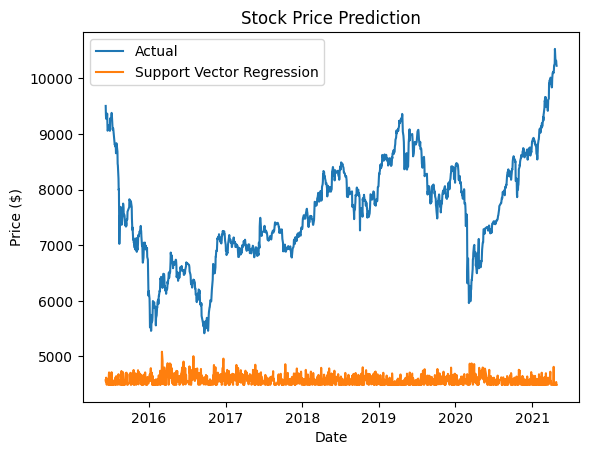

Support Vector Regression MSE: 35.11845087524305


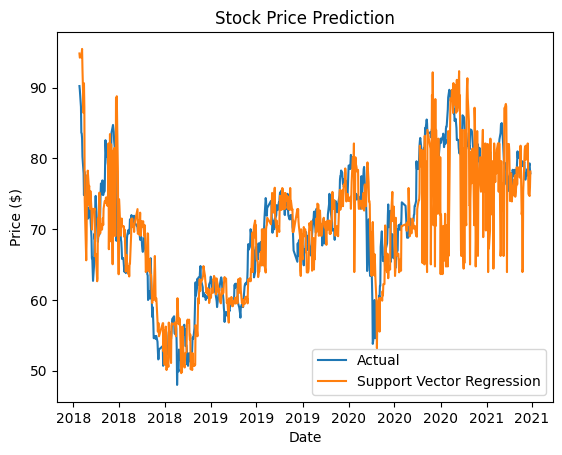

Support Vector Regression MSE: 1.973015412560172


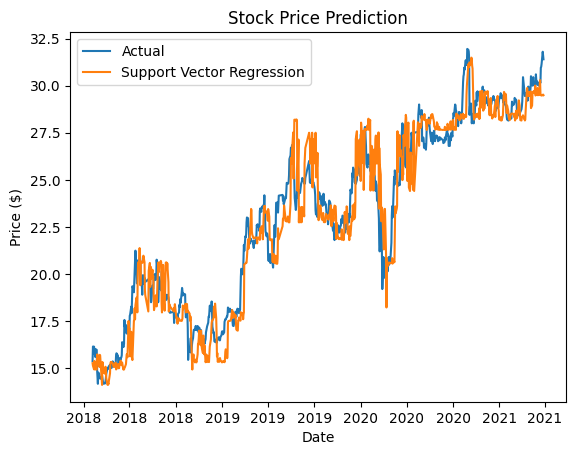

Support Vector Regression MSE: 22.560758134910962


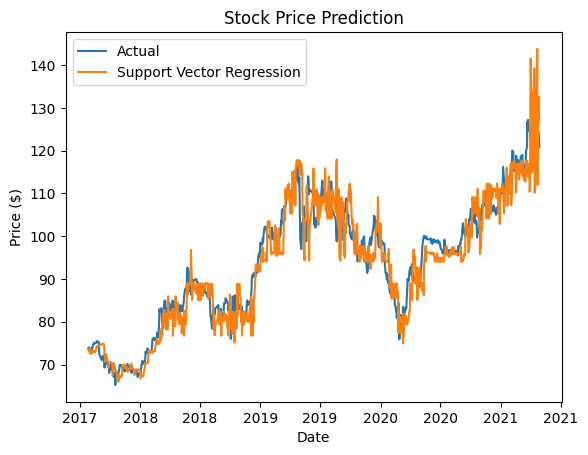

Support Vector Regression MSE: 0.7412828332704083


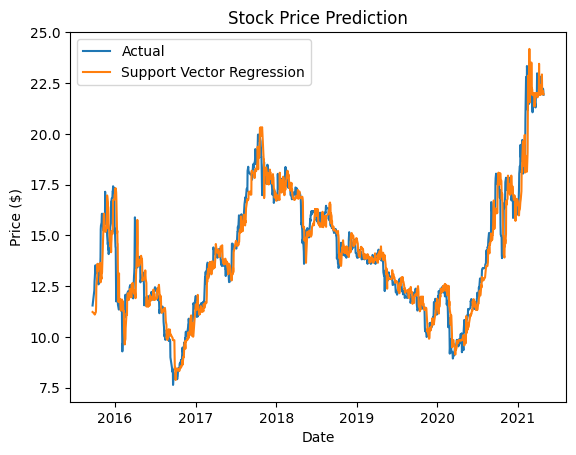

Support Vector Regression MSE: 26.358257325682438


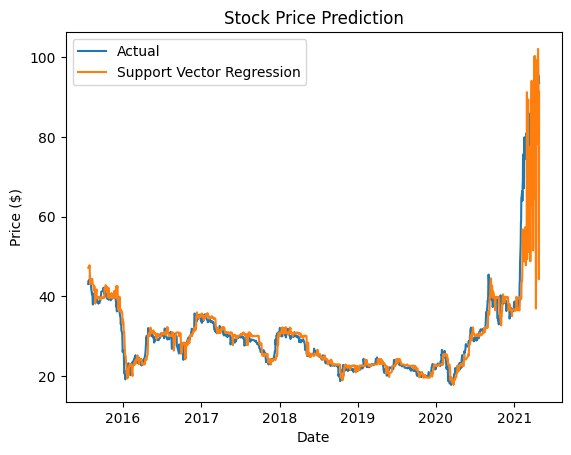

Support Vector Regression MSE: 32.63729703980342


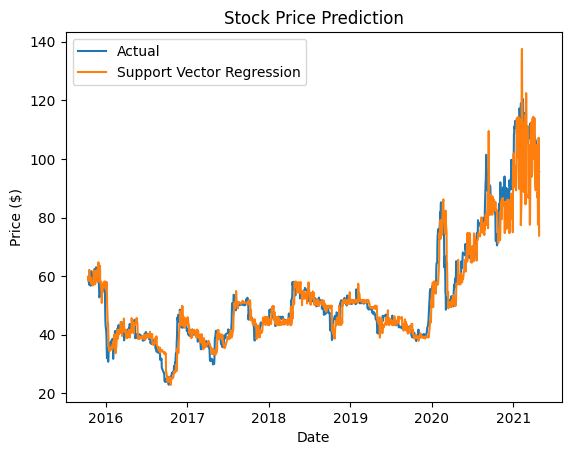

Support Vector Regression MSE: 7.256220088277717


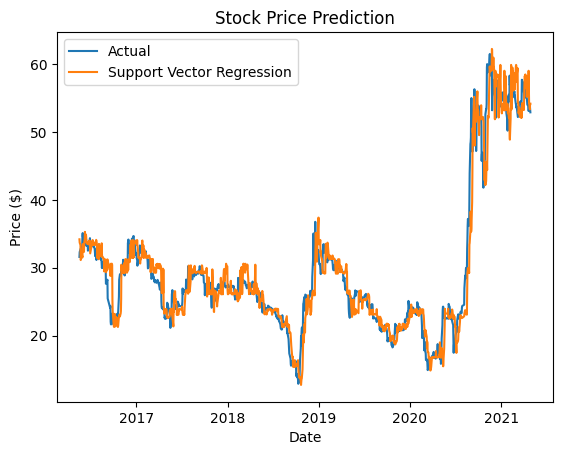

Support Vector Regression MSE: 1.8425504528719792


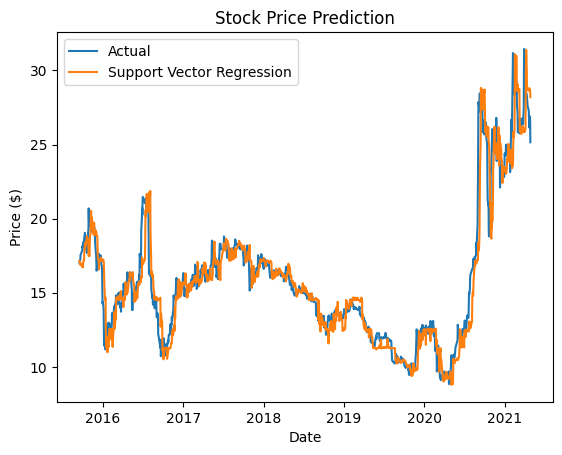

Support Vector Regression MSE: 1.186761531496612


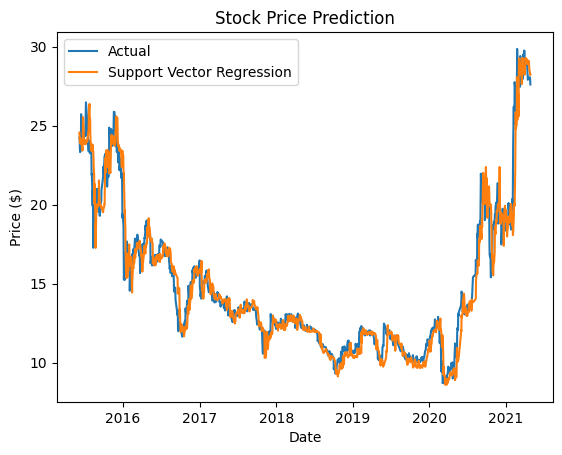

Support Vector Regression MSE: 2.8030370403720326


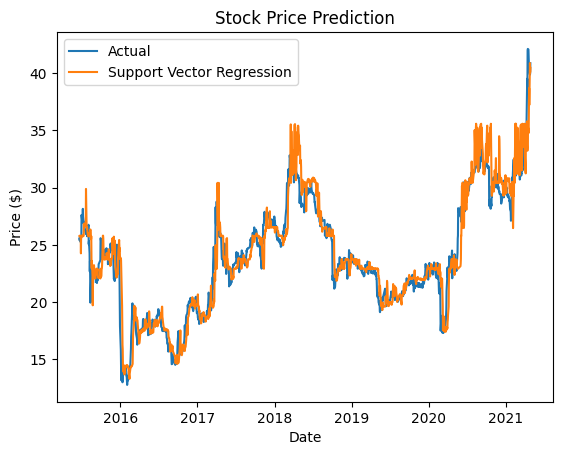

Support Vector Regression MSE: 0.9581953291450416


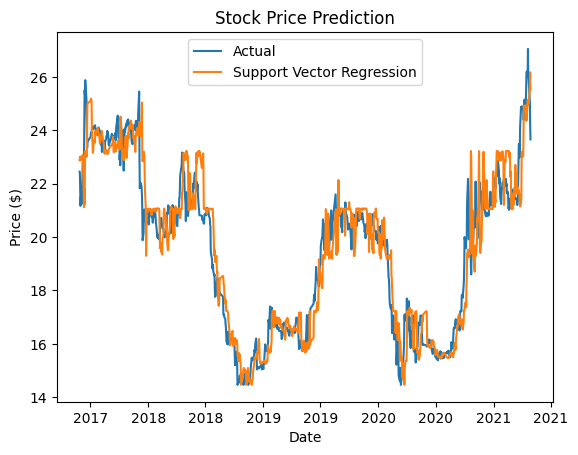

Support Vector Regression MSE: 3.37028428385998


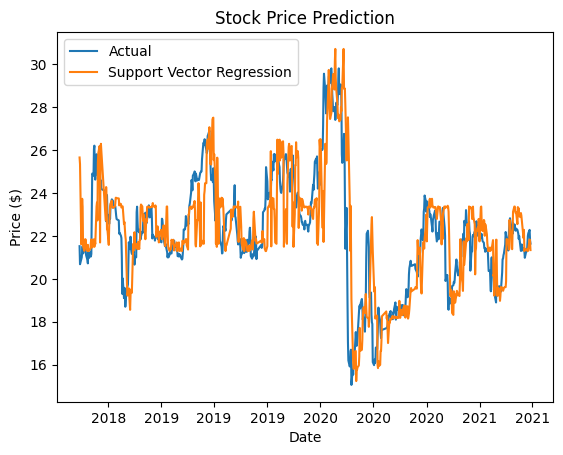

Support Vector Regression MSE: 396.41916354078865


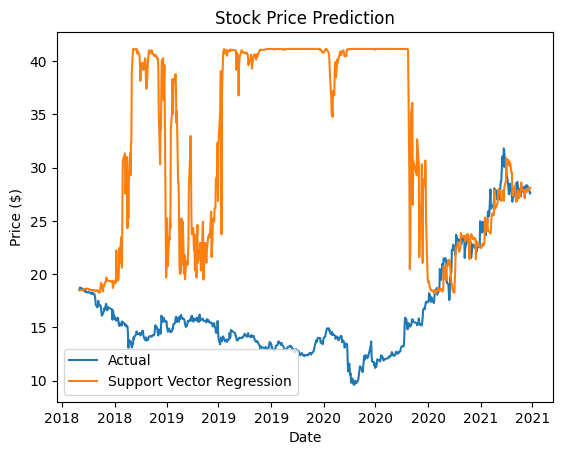

Support Vector Regression MSE: 0.2706464985416799


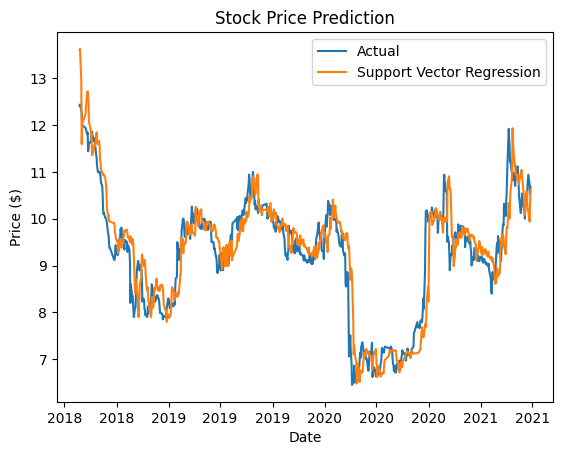

Support Vector Regression MSE: 248.6883288327169


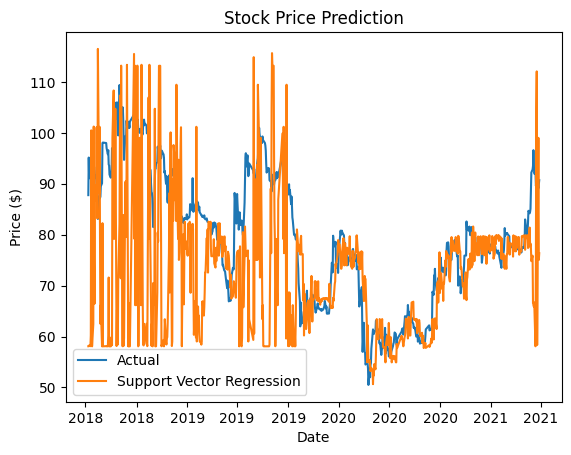

Support Vector Regression MSE: 68.53993872731664


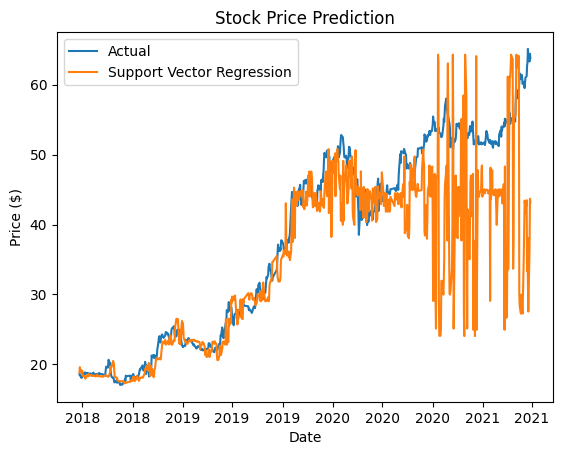

Support Vector Regression MSE: 609.8796839530341


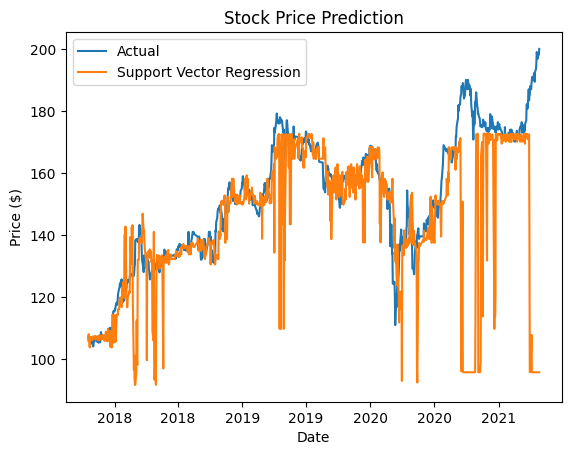

Support Vector Regression MSE: 0.9753059854922013


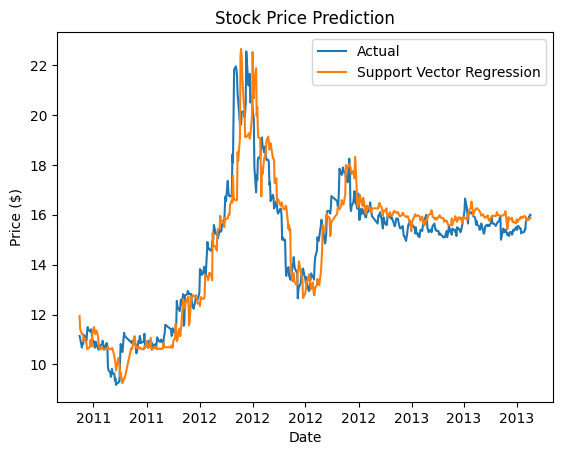

Support Vector Regression MSE: 12.983508102694017


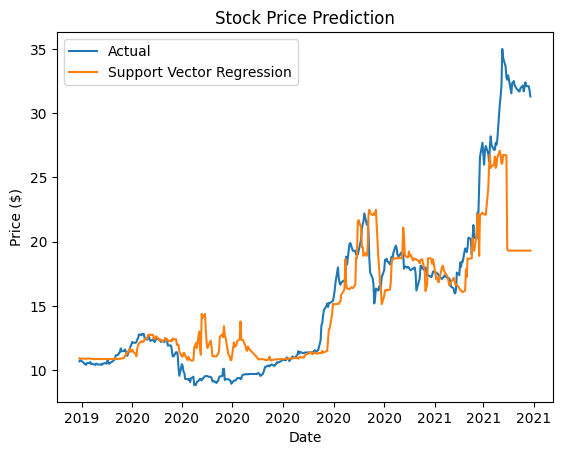

Support Vector Regression MSE: 7.320921178044313


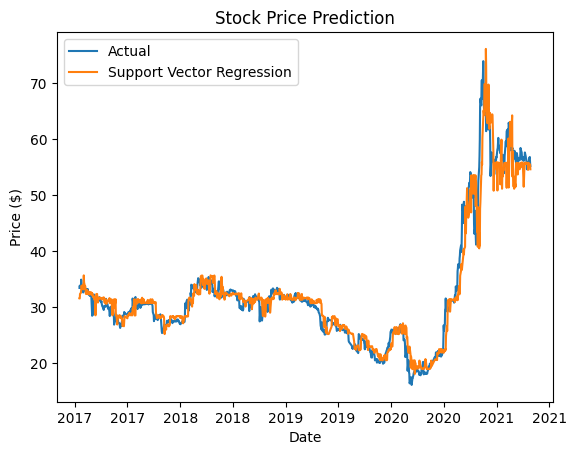

Support Vector Regression MSE: 0.4361687028485224


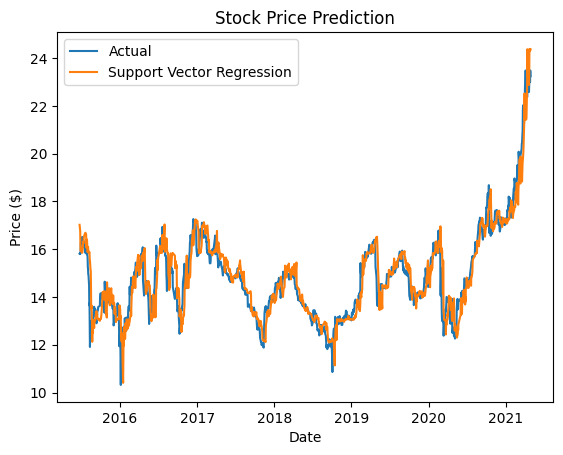

Support Vector Regression MSE: 88.52516308945435


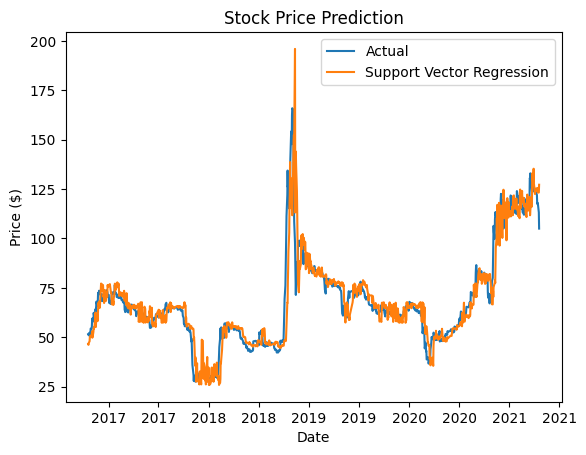

Support Vector Regression MSE: 4.660403746214622


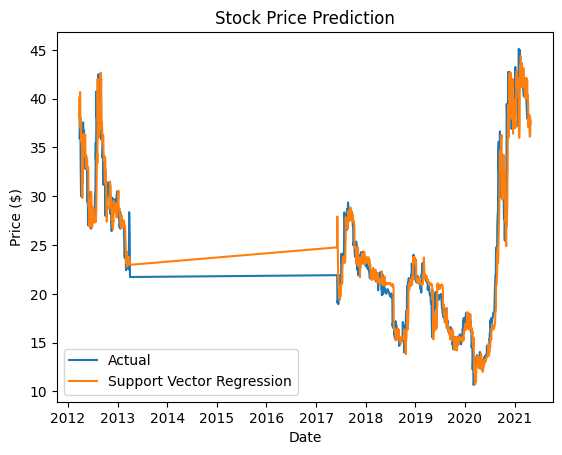

Support Vector Regression MSE: 6.553395437136872


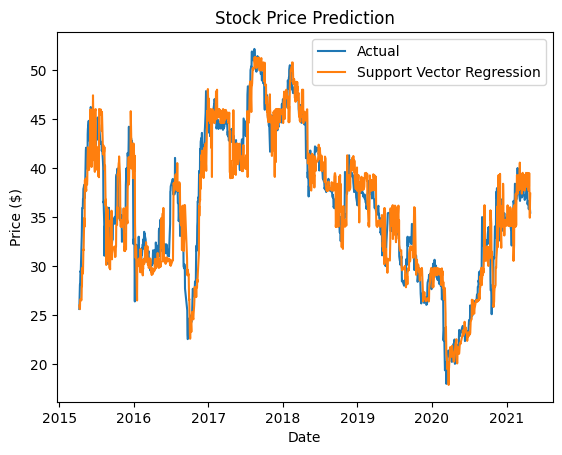

Support Vector Regression MSE: 26.172724221124316


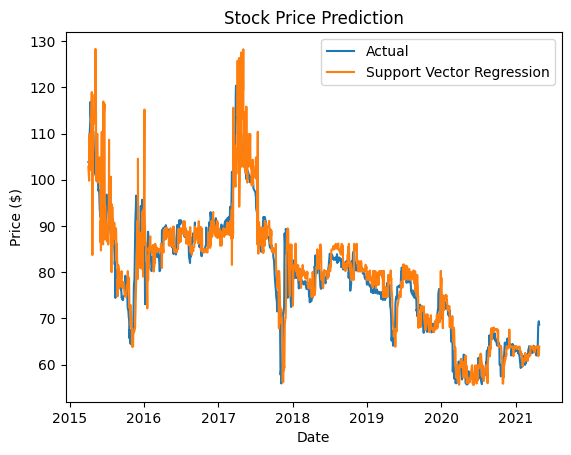

Support Vector Regression MSE: 2.031566991152876


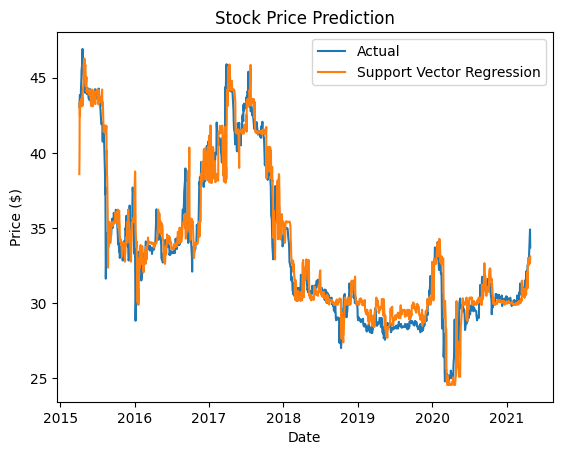

Support Vector Regression MSE: 1.0473146221235612


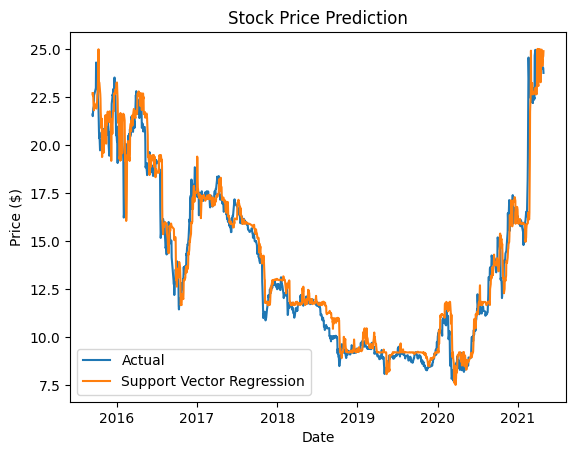

Support Vector Regression MSE: 11.307171974977024


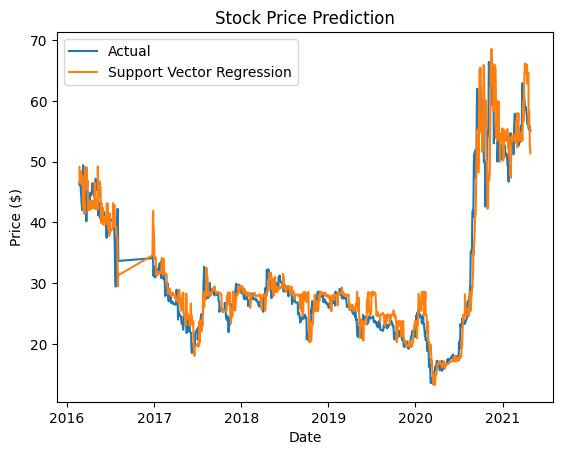

Support Vector Regression MSE: 22205.903597645916


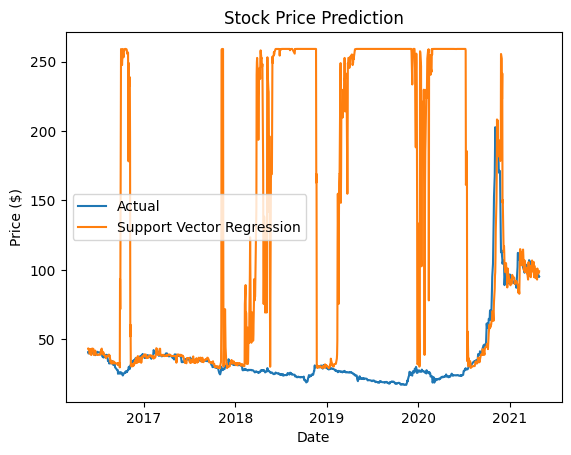

Support Vector Regression MSE: 5.664450497683537


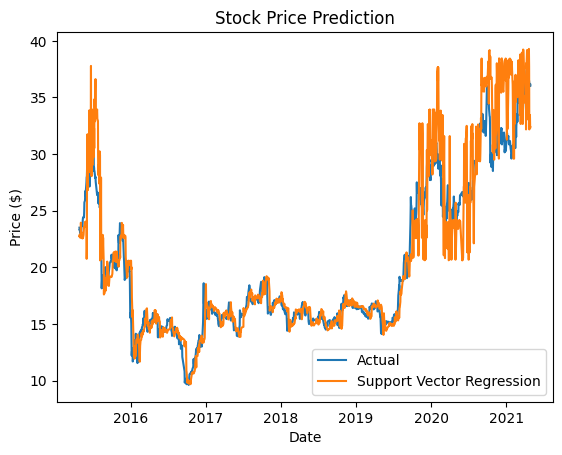

Support Vector Regression MSE: 1.2066604626509017


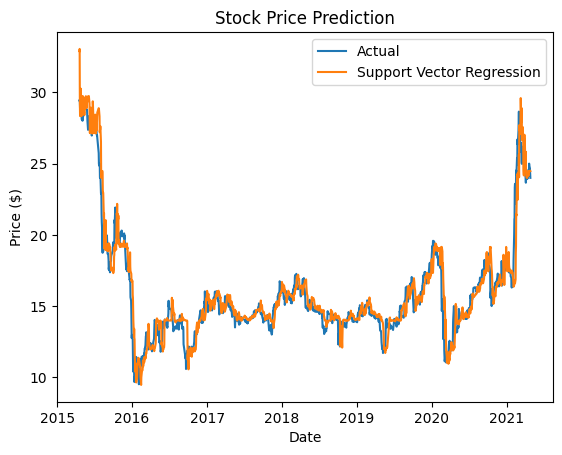

Support Vector Regression MSE: 5.061383755606008


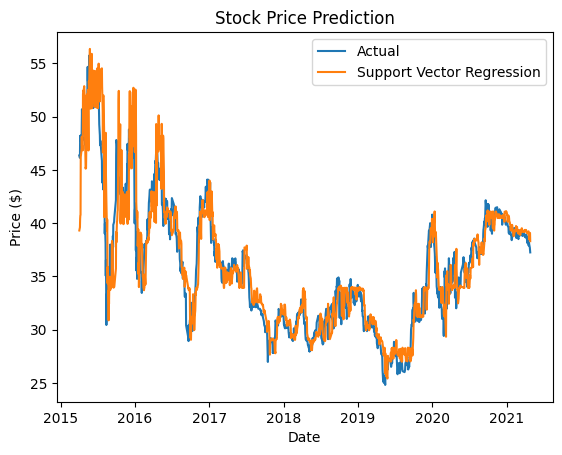

Support Vector Regression MSE: 0.5408375279023008


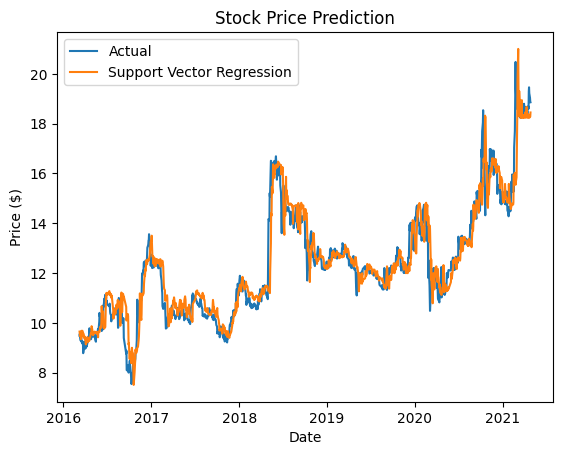

Support Vector Regression MSE: 1.395951897761362


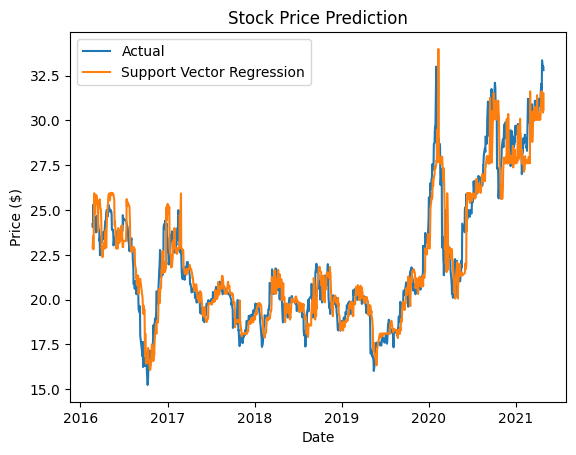

Support Vector Regression MSE: 1.3987076247479318


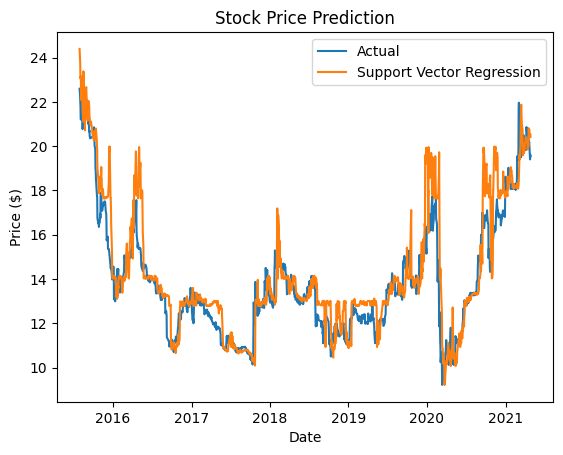

Support Vector Regression MSE: 14.012829390775874


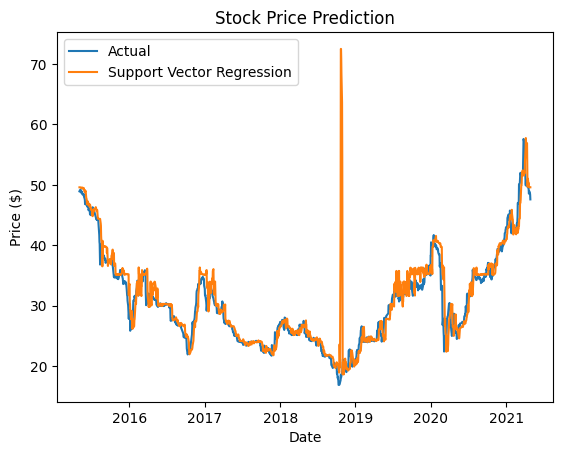

Support Vector Regression MSE: 4.415814865781316


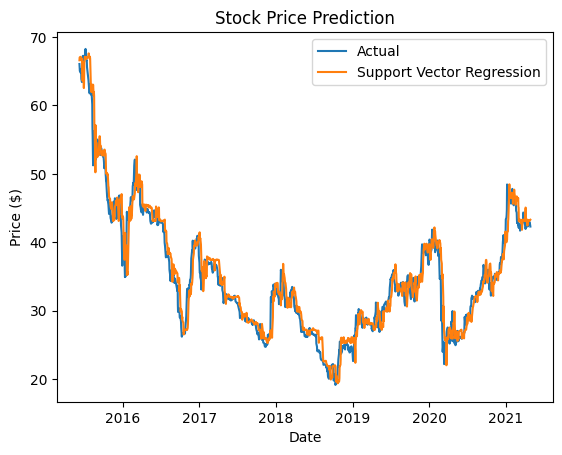

Support Vector Regression MSE: 25.747871261071495


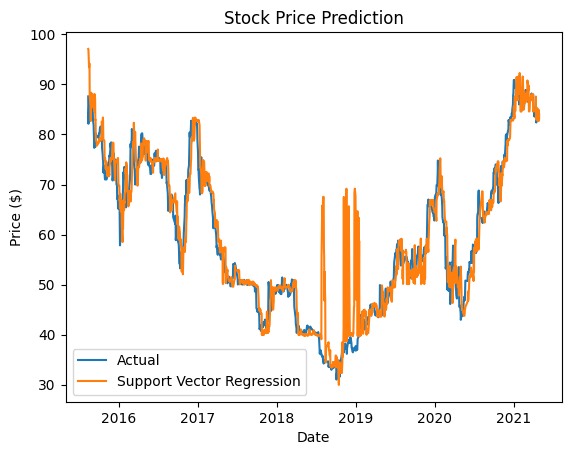

Support Vector Regression MSE: 8.790862468333389


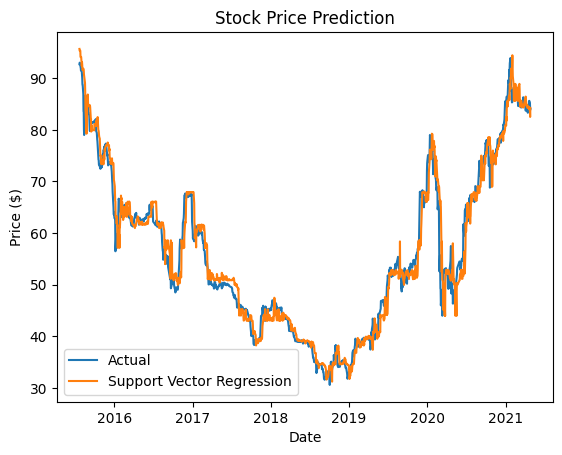

Support Vector Regression MSE: 11.207955227924815


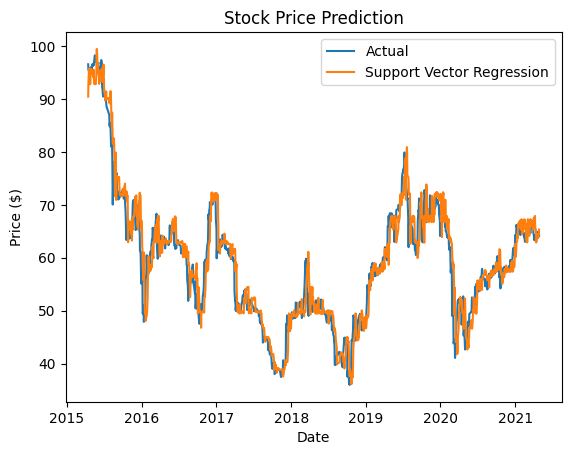

Support Vector Regression MSE: 1.5968711166207317


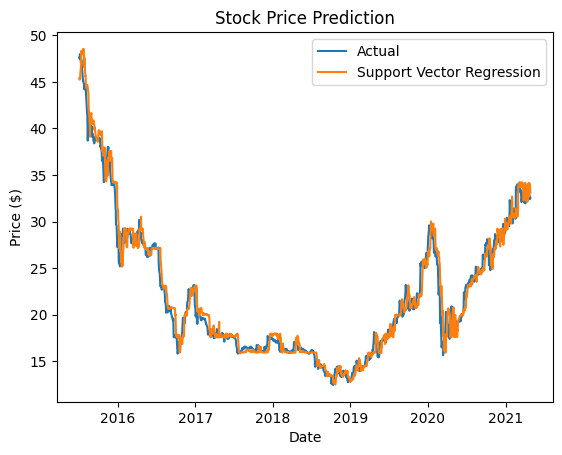

Support Vector Regression MSE: 4.822743288265131


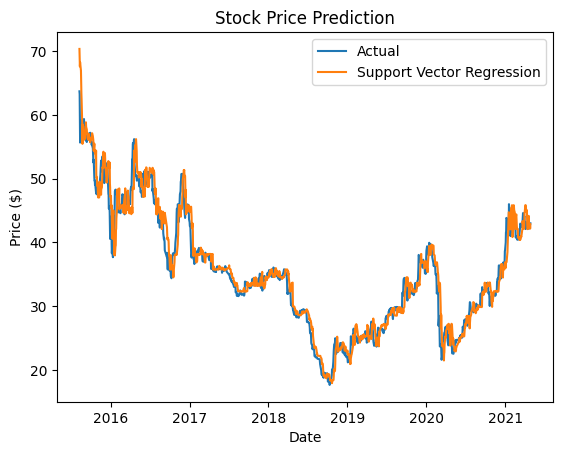

Support Vector Regression MSE: 3.7105777903221733


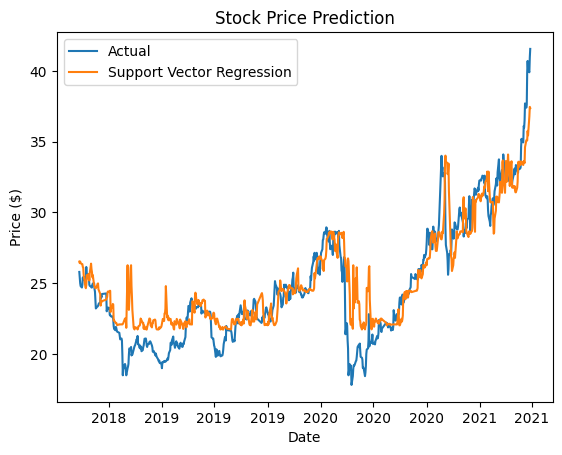

Support Vector Regression MSE: 0.9529043674938404


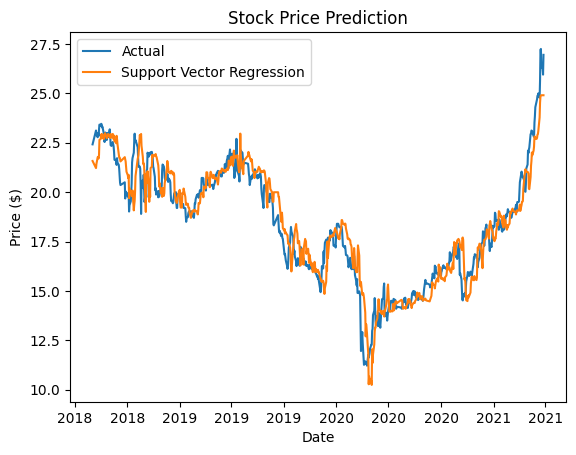

Support Vector Regression MSE: 4326.54315843377


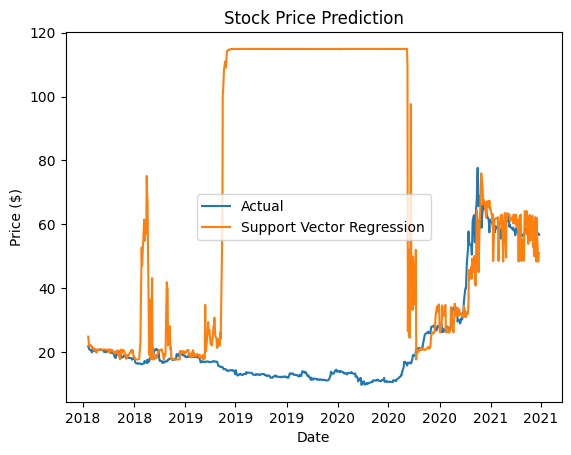

Support Vector Regression MSE: 6.654845005401186


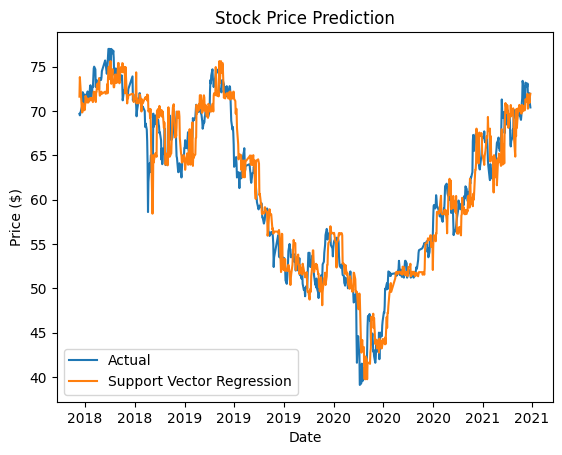

Support Vector Regression MSE: 4.976437137262472


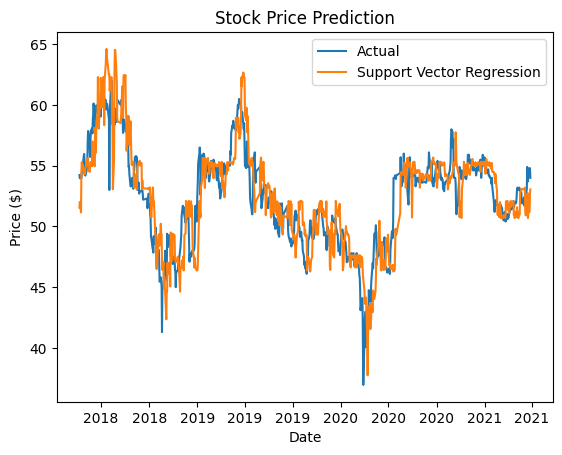

Support Vector Regression MSE: 2131.4721300735446


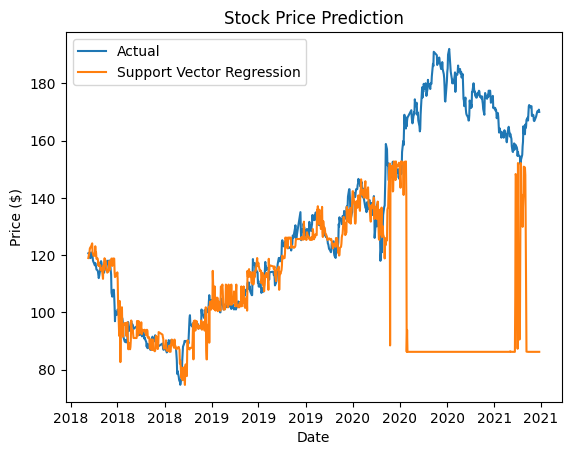

Support Vector Regression MSE: 1.992562772694931


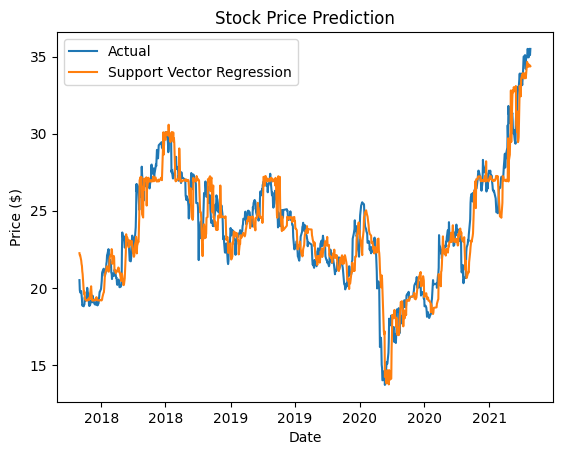

Support Vector Regression MSE: 1053.696127774472


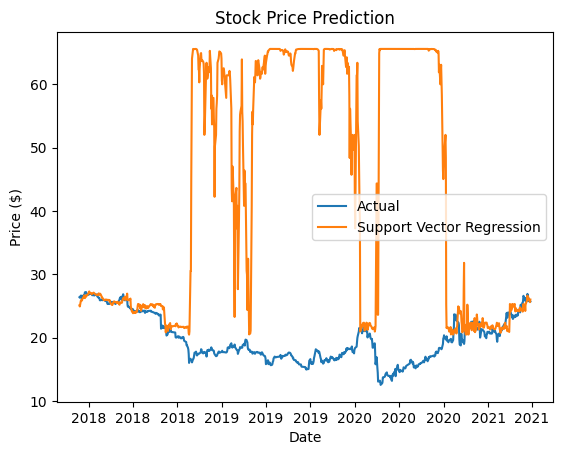

Support Vector Regression MSE: 1.368083377904228


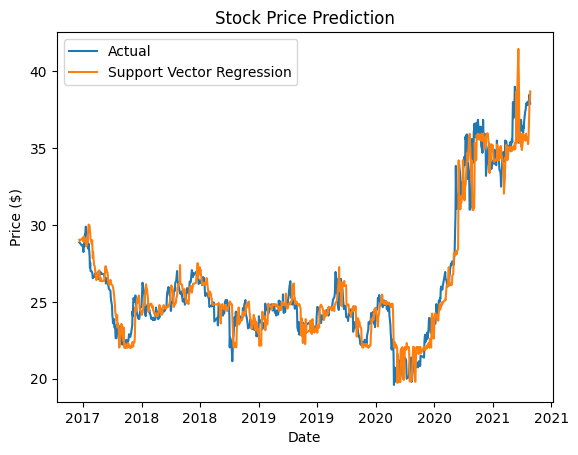

Support Vector Regression MSE: 2.6071249716037803


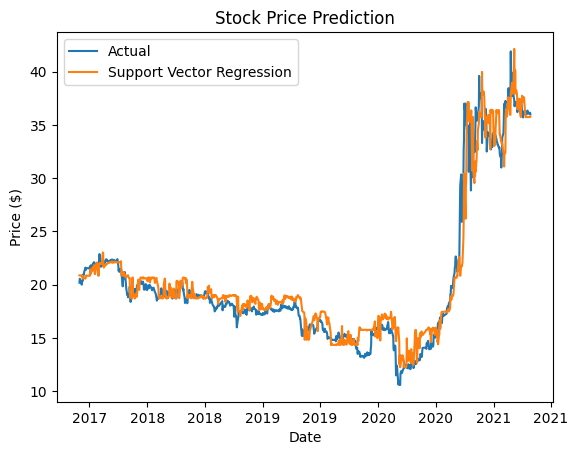

Support Vector Regression MSE: 4.335192898389469


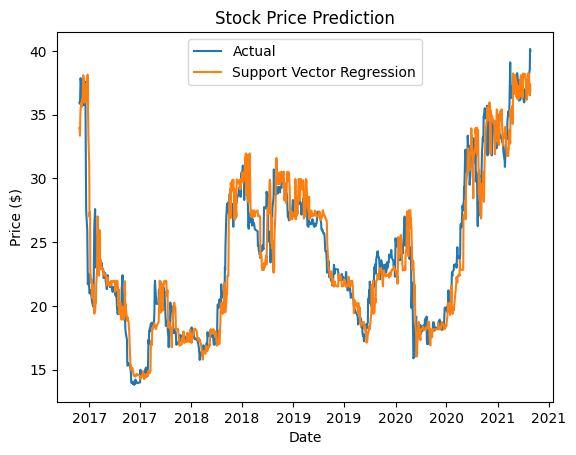

Support Vector Regression MSE: 0.9209052998093876


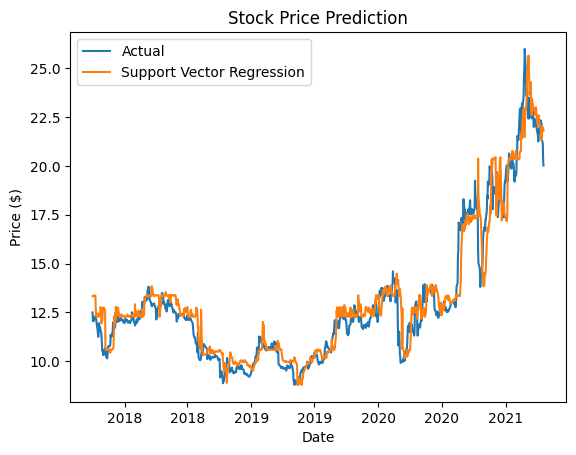

Support Vector Regression MSE: 3.2128705236969974


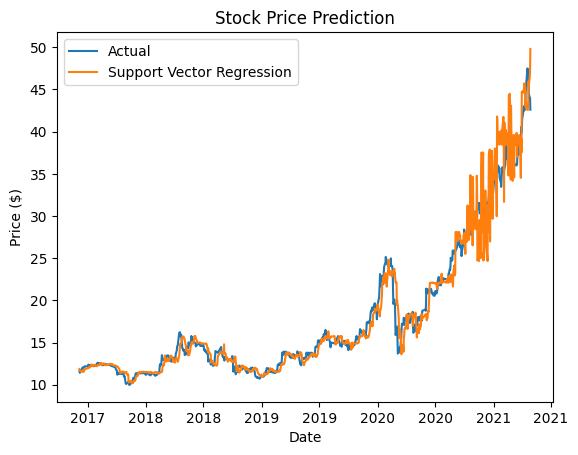

Support Vector Regression MSE: 5.3769035099669225


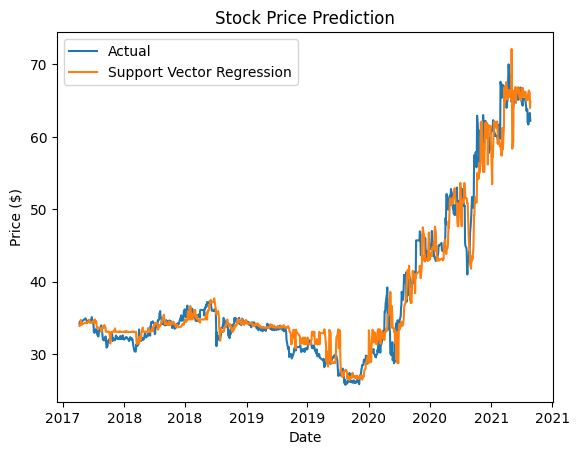

Support Vector Regression MSE: 5.420715394057528


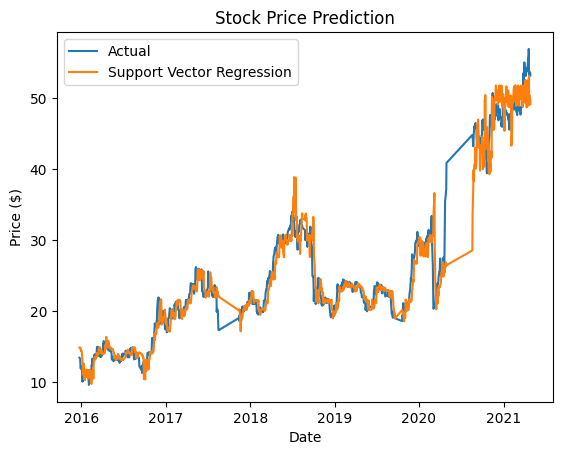

Support Vector Regression MSE: 708.3151660936347


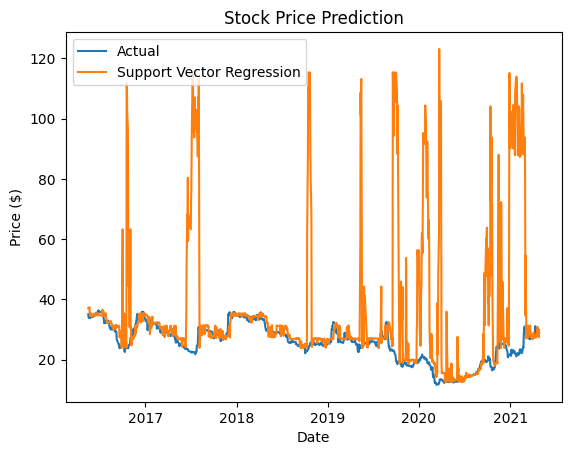

Support Vector Regression MSE: 1.7515607970073532


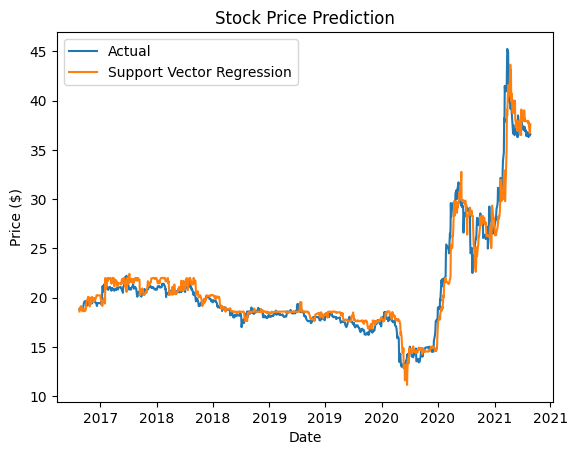

Support Vector Regression MSE: 0.49946207442946716


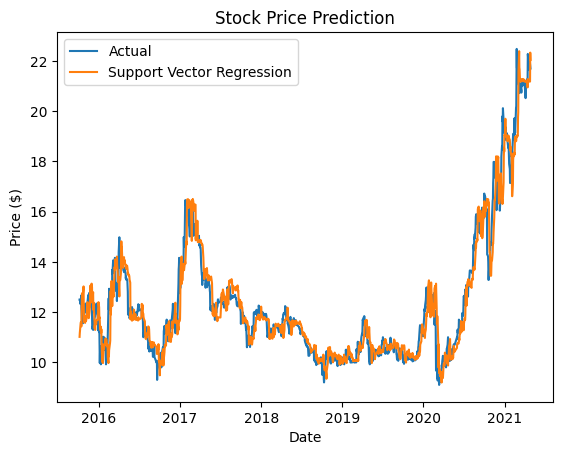

Support Vector Regression MSE: 0.6558792659774477


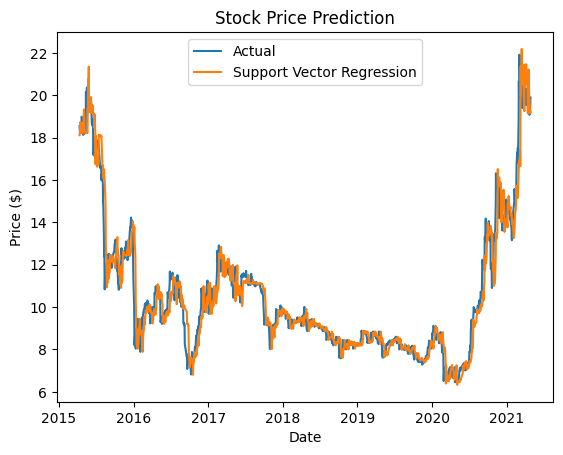

Support Vector Regression MSE: 2.847728365972118


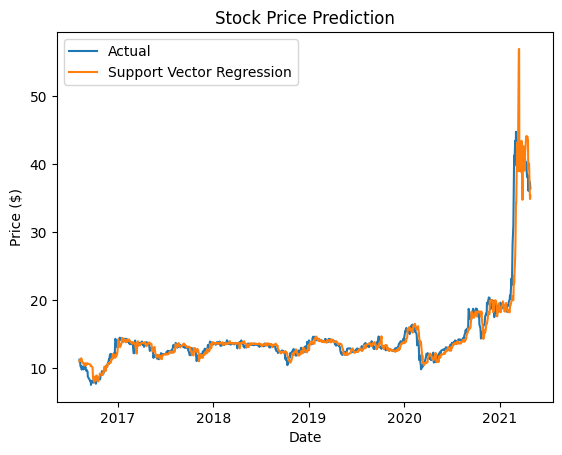

Support Vector Regression MSE: 2377.055383392154


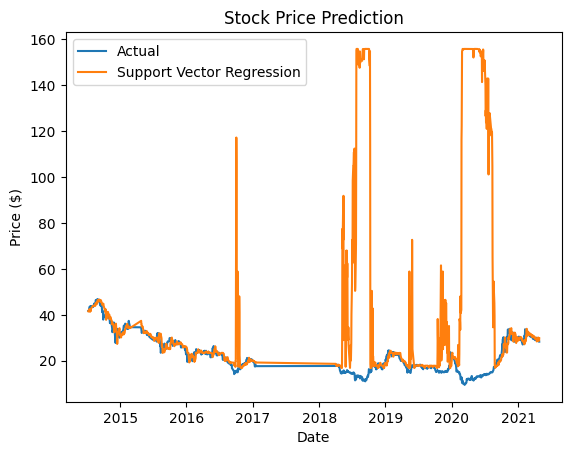

Support Vector Regression MSE: 77.2878997362896


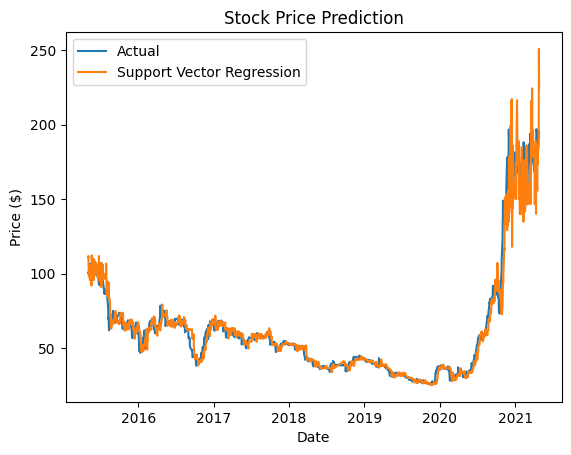

Support Vector Regression MSE: 0.9273142676930385


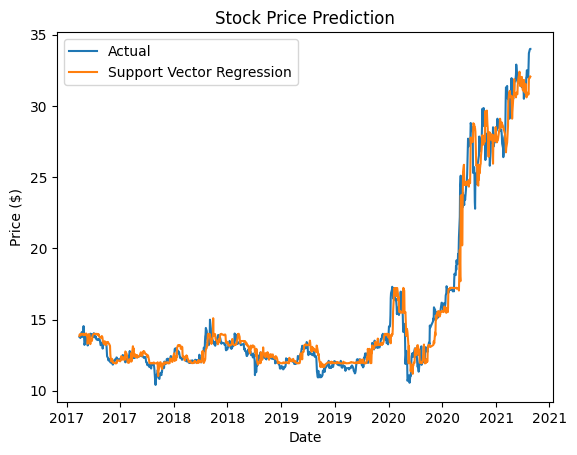

Support Vector Regression MSE: 1.343899696153569


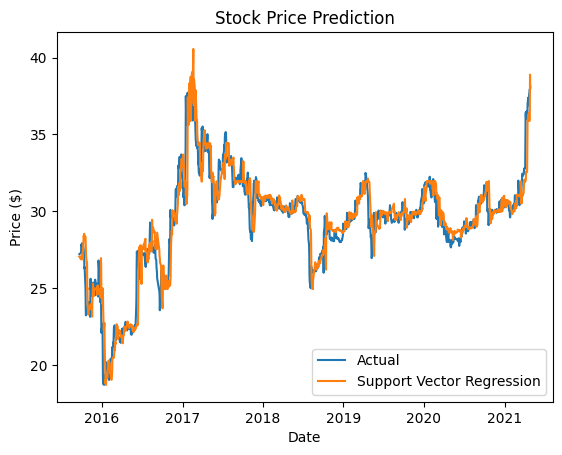

Support Vector Regression MSE: 2.995383024124435


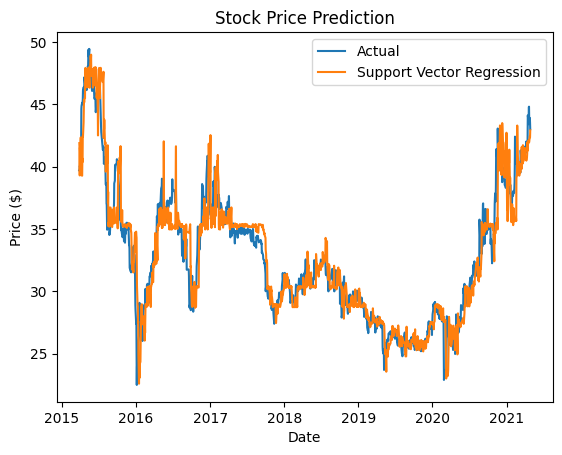

Support Vector Regression MSE: 1.439142416915003


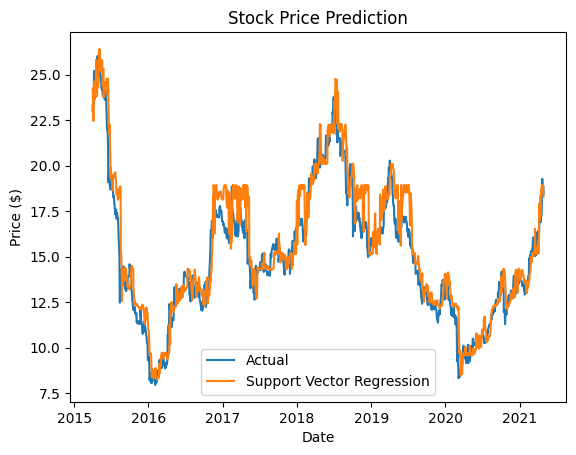

Support Vector Regression MSE: 7.4456235748873985


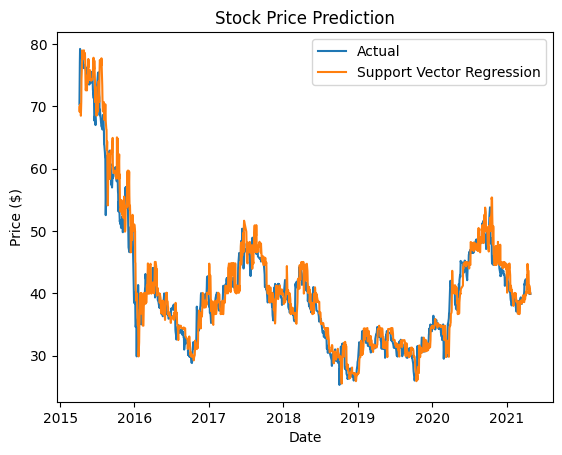

Support Vector Regression MSE: 3.0266797056508388


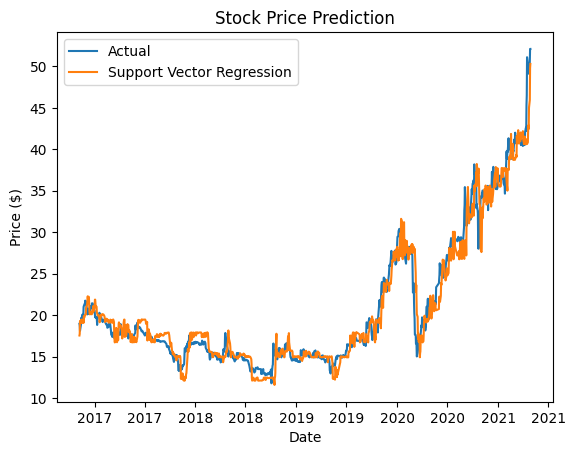

Support Vector Regression MSE: 75.20984655455061


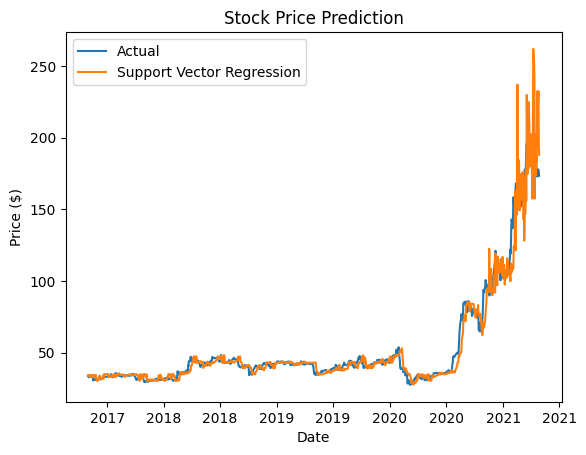

Support Vector Regression MSE: 14.035453239813455


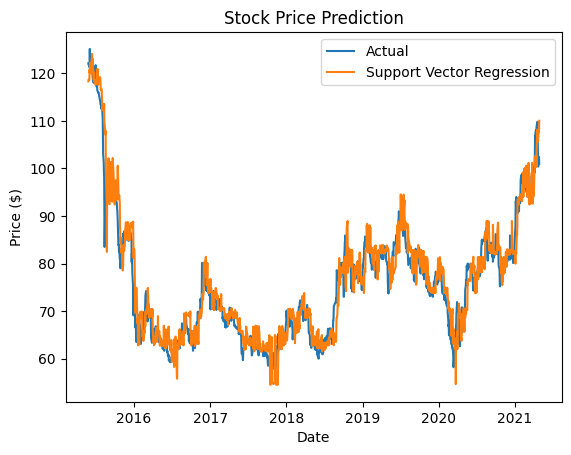

Support Vector Regression MSE: 27.139327051240883


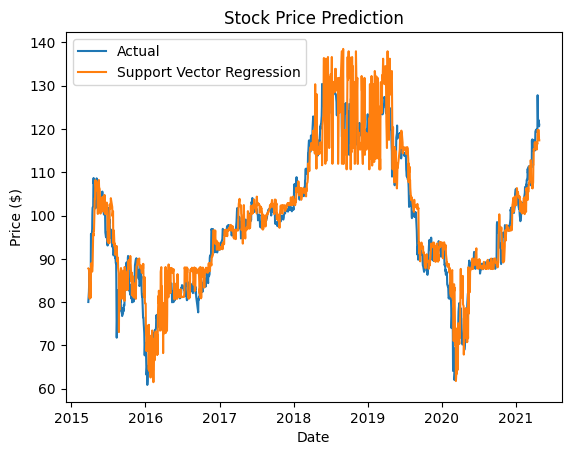

Support Vector Regression MSE: 2.5344823045197176


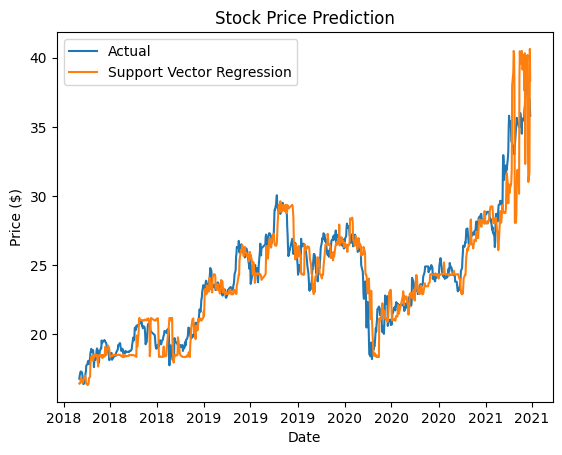

Support Vector Regression MSE: 9.202766281995563


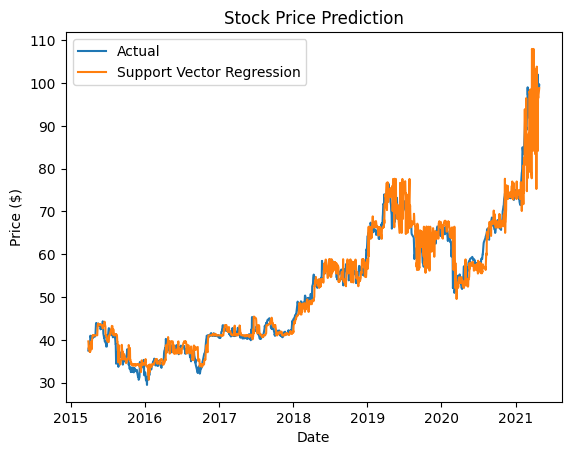

Support Vector Regression MSE: 1.124590782840503


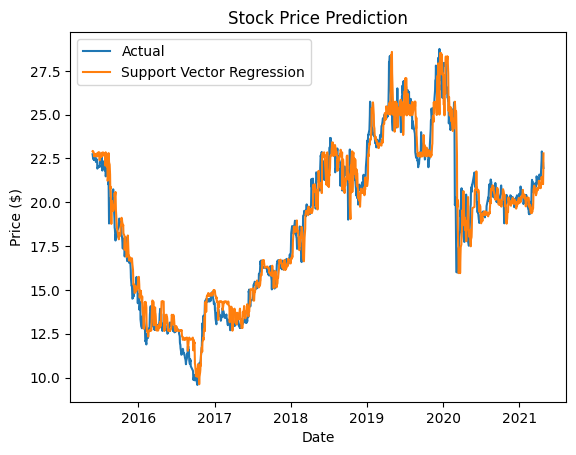

Support Vector Regression MSE: 2.2996072901773563


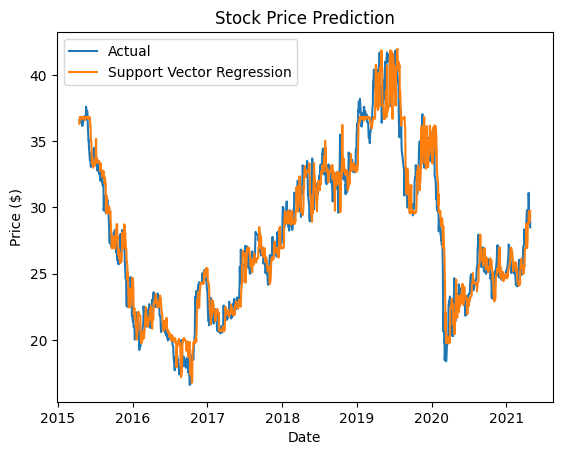

Support Vector Regression MSE: 3.1466854566434828


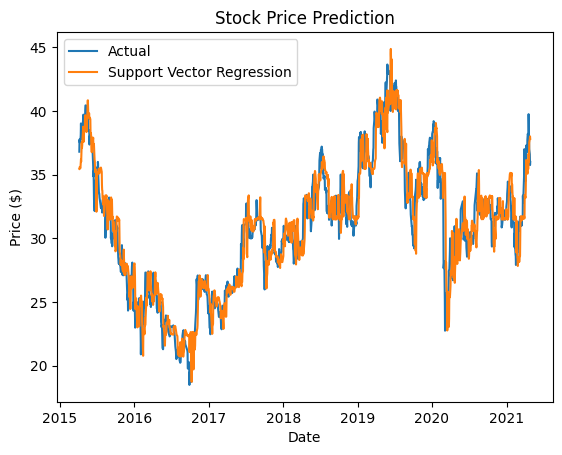

Support Vector Regression MSE: 0.36803185481687967


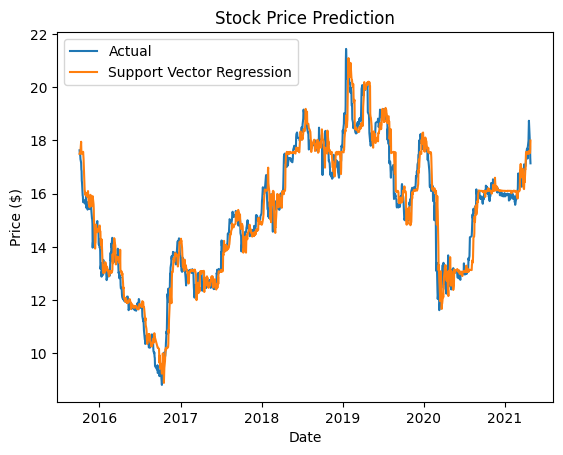

Support Vector Regression MSE: 0.4425881465062349


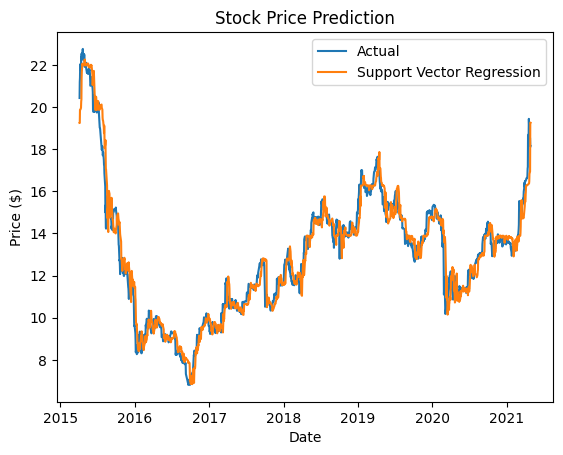

Support Vector Regression MSE: 0.9179807574229881


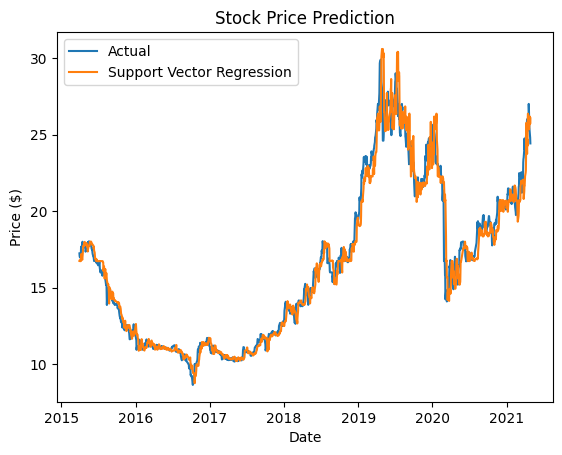

In [ ]:

for symbol in final_stocksList:
    df_stock = pd.DataFrame(df_ٍSVR[df_ٍSVR['tiker'] == symbol][['close']])
    train_and_plot_svr(df_stock)